## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "singer_age_decade_70"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "singer_age_decade"
target_positive_class = 70


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 100


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7061
Epoch 1 Validation Loss: 0.6971
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6466
Epoch 11 Validation Loss: 0.6608
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5996
Epoch 21 Validation Loss: 0.6360
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5595
Epoch 31 Validation Loss: 0.6216
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5245
Epoch 41 Validation Loss: 0.6137
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4935
Epoch 51 Validation Loss: 0.6083
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4658
Epoch 61 Validation Loss: 0.6035
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

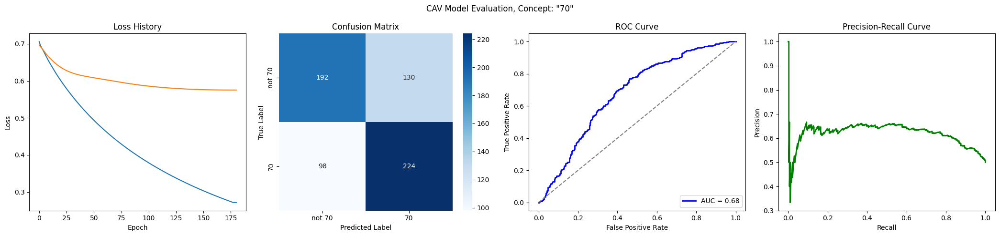

Training run 2/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6116
Epoch 11 Validation Loss: 0.6727
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5544
Epoch 21 Validation Loss: 0.6630
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5106
Epoch 31 Validation Loss: 0.6597
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4740
Epoch 41 Validation Loss: 0.6578
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4421
Epoch 51 Validation Loss: 0.6560
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4140
Epoch 61 Validation Loss: 0.6550
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

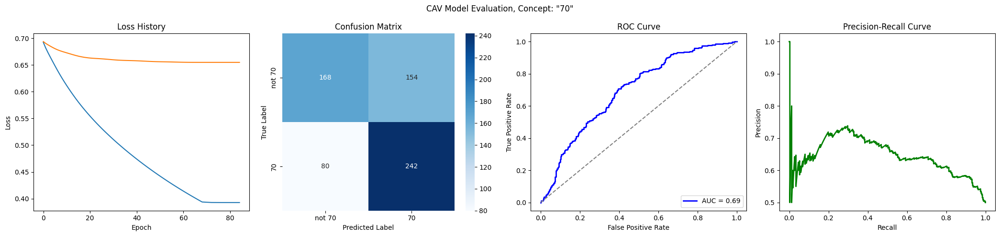

Training run 3/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6961
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6239
Epoch 11 Validation Loss: 0.6676
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5721
Epoch 21 Validation Loss: 0.6569
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5320
Epoch 31 Validation Loss: 0.6513
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4983
Epoch 41 Validation Loss: 0.6473
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4691
Epoch 51 Validation Loss: 0.6447
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4436
Epoch 61 Validation Loss: 0.6435
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 69
Loss

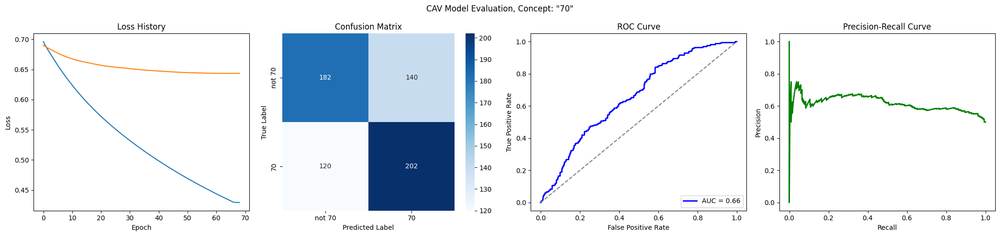

Training run 4/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7048
Epoch 1 Validation Loss: 0.6866
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6200
Epoch 11 Validation Loss: 0.6536
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5608
Epoch 21 Validation Loss: 0.6404
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5174
Epoch 31 Validation Loss: 0.6387
Early stopping at epoch 34
Loss history saved to trainings/singer_age_decade_70/loss_history.json


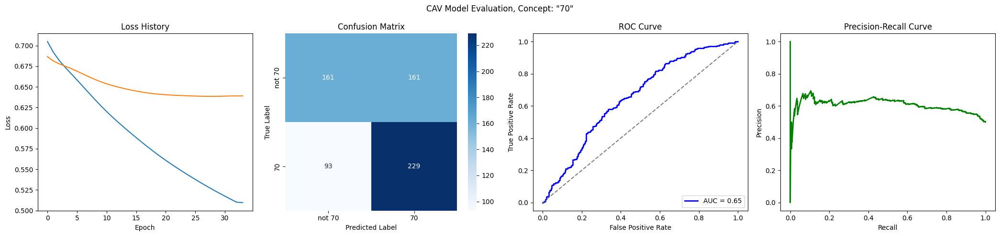

Training run 5/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6364
Epoch 11 Validation Loss: 0.6592
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5881
Epoch 21 Validation Loss: 0.6380
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5485
Epoch 31 Validation Loss: 0.6251
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5149
Epoch 41 Validation Loss: 0.6166
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4855
Epoch 51 Validation Loss: 0.6097
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4594
Epoch 61 Validation Loss: 0.6040
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

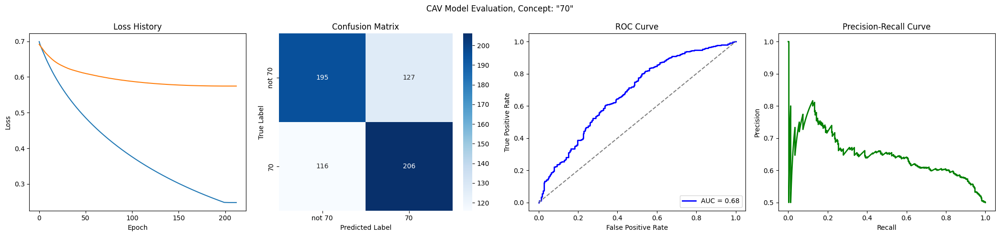

Training run 6/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6883
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6429
Epoch 11 Validation Loss: 0.6530
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6002
Epoch 21 Validation Loss: 0.6291
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5628
Epoch 31 Validation Loss: 0.6135
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5290
Epoch 41 Validation Loss: 0.6025
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4983
Epoch 51 Validation Loss: 0.5938
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4704
Epoch 61 Validation Loss: 0.5862
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

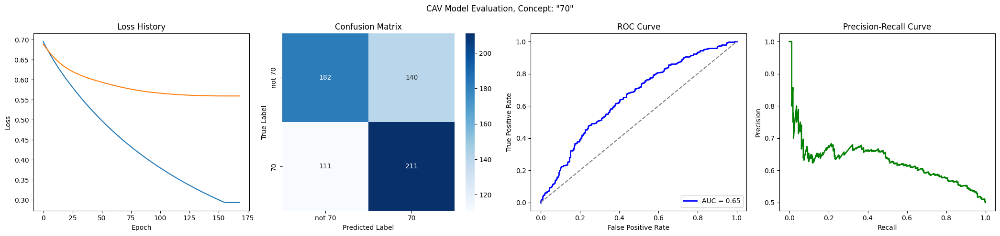

Training run 7/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6198
Epoch 11 Validation Loss: 0.6524
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5647
Epoch 21 Validation Loss: 0.6319
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5241
Epoch 31 Validation Loss: 0.6221
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4921
Epoch 41 Validation Loss: 0.6171
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4650
Epoch 51 Validation Loss: 0.6140
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4413
Epoch 61 Validation Loss: 0.6119
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

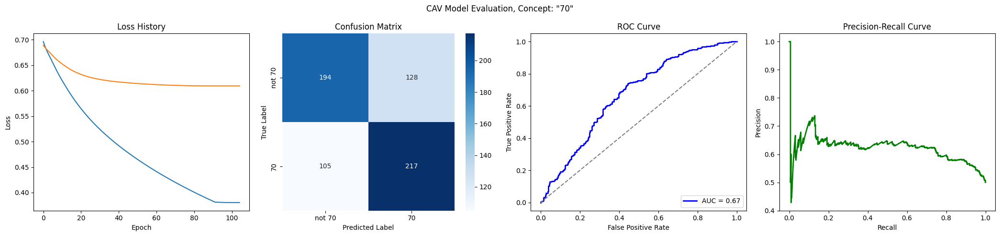

Training run 8/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6950
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6252
Epoch 11 Validation Loss: 0.6477
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5689
Epoch 21 Validation Loss: 0.6163
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5240
Epoch 31 Validation Loss: 0.5974
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4862
Epoch 41 Validation Loss: 0.5864
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4536
Epoch 51 Validation Loss: 0.5797
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4249
Epoch 61 Validation Loss: 0.5749
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

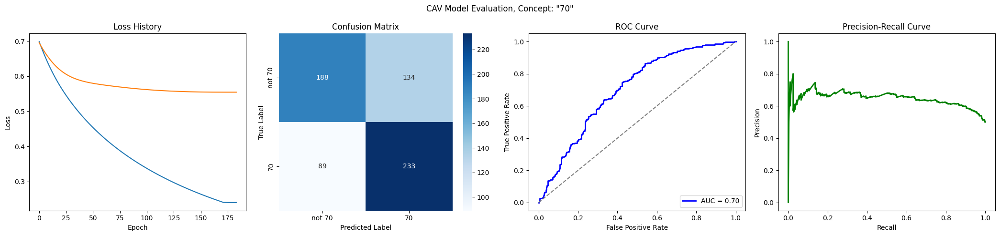

Training run 9/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6425
Epoch 11 Validation Loss: 0.6515
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5986
Epoch 21 Validation Loss: 0.6255
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5611
Epoch 31 Validation Loss: 0.6097
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5278
Epoch 41 Validation Loss: 0.5993
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4982
Epoch 51 Validation Loss: 0.5916
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4717
Epoch 61 Validation Loss: 0.5851
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

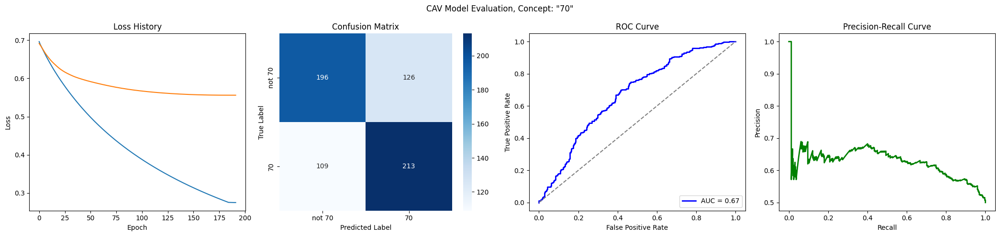

Training run 10/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6881
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6272
Epoch 11 Validation Loss: 0.6698
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5745
Epoch 21 Validation Loss: 0.6604
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5313
Epoch 31 Validation Loss: 0.6565
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4948
Epoch 41 Validation Loss: 0.6558
Early stopping at epoch 45
Loss history saved to trainings/singer_age_decade_70/loss_history.json


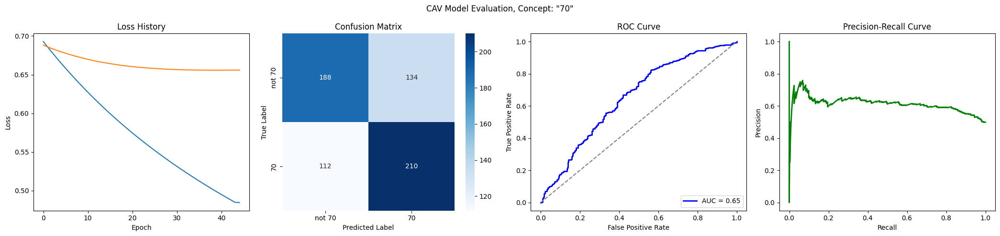

Training run 11/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6250
Epoch 11 Validation Loss: 0.6560
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5717
Epoch 21 Validation Loss: 0.6353
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5297
Epoch 31 Validation Loss: 0.6229
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4946
Epoch 41 Validation Loss: 0.6138
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4644
Epoch 51 Validation Loss: 0.6063
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4379
Epoch 61 Validation Loss: 0.6005
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

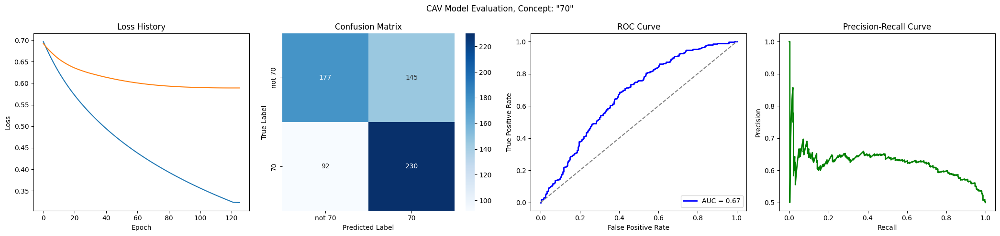

Training run 12/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7002
Epoch 1 Validation Loss: 0.6994
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6345
Epoch 11 Validation Loss: 0.6594
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5825
Epoch 21 Validation Loss: 0.6305
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5397
Epoch 31 Validation Loss: 0.6107
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5036
Epoch 41 Validation Loss: 0.5965
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4724
Epoch 51 Validation Loss: 0.5857
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4453
Epoch 61 Validation Loss: 0.5766
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

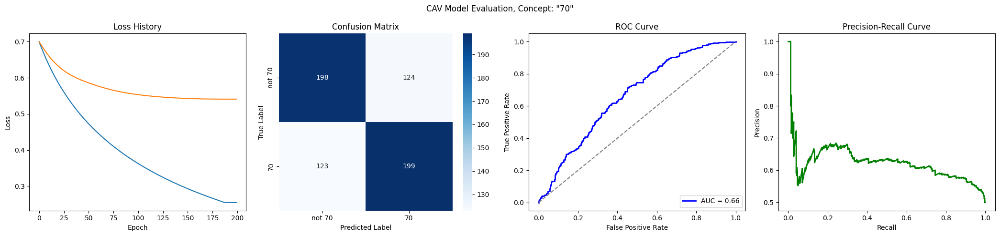

Training run 13/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6883
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6246
Epoch 11 Validation Loss: 0.6438
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5731
Epoch 21 Validation Loss: 0.6152
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5322
Epoch 31 Validation Loss: 0.5970
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4978
Epoch 41 Validation Loss: 0.5851
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4678
Epoch 51 Validation Loss: 0.5770
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4413
Epoch 61 Validation Loss: 0.5714
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

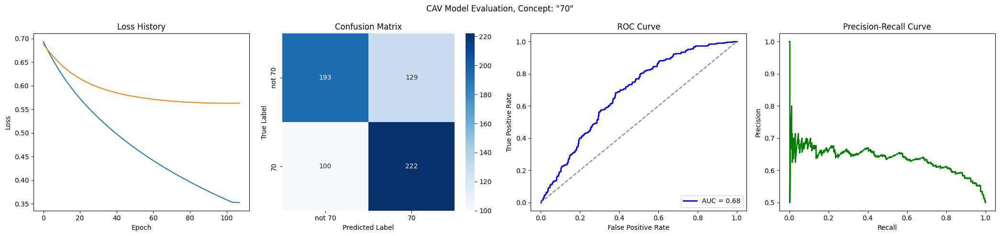

Training run 14/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7038
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6367
Epoch 11 Validation Loss: 0.6558
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5862
Epoch 21 Validation Loss: 0.6322
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5470
Epoch 31 Validation Loss: 0.6184
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5147
Epoch 41 Validation Loss: 0.6099
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4871
Epoch 51 Validation Loss: 0.6043
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4629
Epoch 61 Validation Loss: 0.6004
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

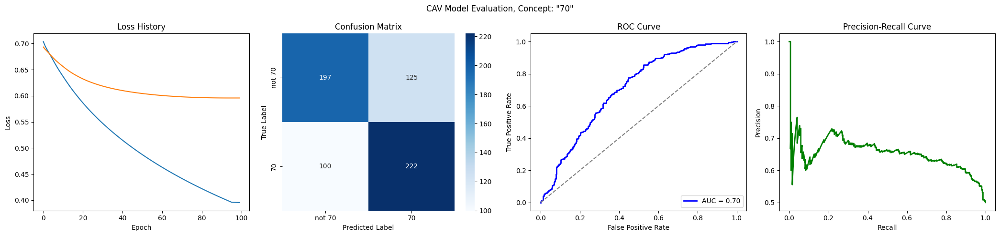

Training run 15/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6894
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6173
Epoch 11 Validation Loss: 0.6601
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5612
Epoch 21 Validation Loss: 0.6434
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5170
Epoch 31 Validation Loss: 0.6349
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4810
Epoch 41 Validation Loss: 0.6300
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4506
Epoch 51 Validation Loss: 0.6272
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4245
Epoch 61 Validation Loss: 0.6256
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

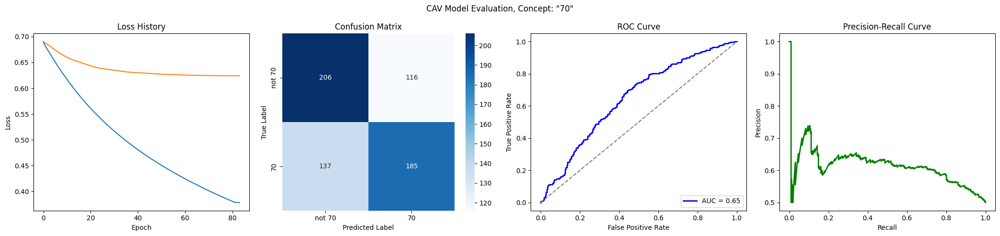

Training run 16/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6990
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6287
Epoch 11 Validation Loss: 0.6733
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5766
Epoch 21 Validation Loss: 0.6648
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5357
Epoch 31 Validation Loss: 0.6600
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5011
Epoch 41 Validation Loss: 0.6549
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4707
Epoch 51 Validation Loss: 0.6496
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4437
Epoch 61 Validation Loss: 0.6448
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

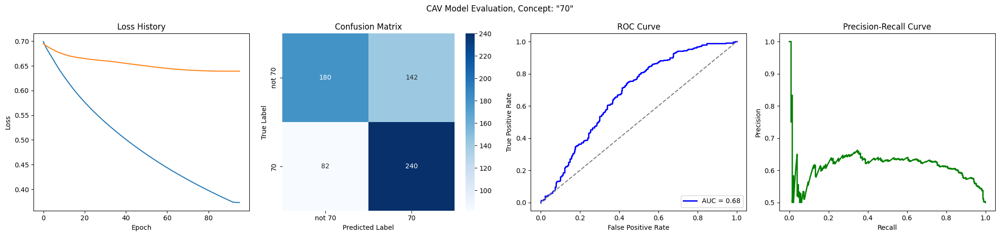

Training run 17/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6306
Epoch 11 Validation Loss: 0.6596
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5817
Epoch 21 Validation Loss: 0.6417
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5406
Epoch 31 Validation Loss: 0.6311
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5047
Epoch 41 Validation Loss: 0.6238
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4734
Epoch 51 Validation Loss: 0.6187
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4459
Epoch 61 Validation Loss: 0.6144
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

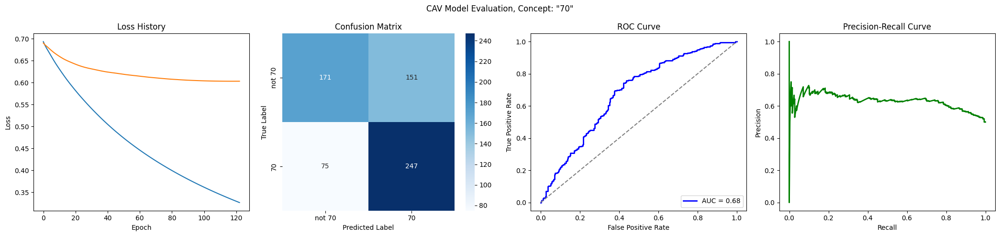

Training run 18/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6910
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6222
Epoch 11 Validation Loss: 0.6757
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5686
Epoch 21 Validation Loss: 0.6684
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5255
Epoch 31 Validation Loss: 0.6635
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4894
Epoch 41 Validation Loss: 0.6593
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4585
Epoch 51 Validation Loss: 0.6562
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4316
Epoch 61 Validation Loss: 0.6549
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 68
Los

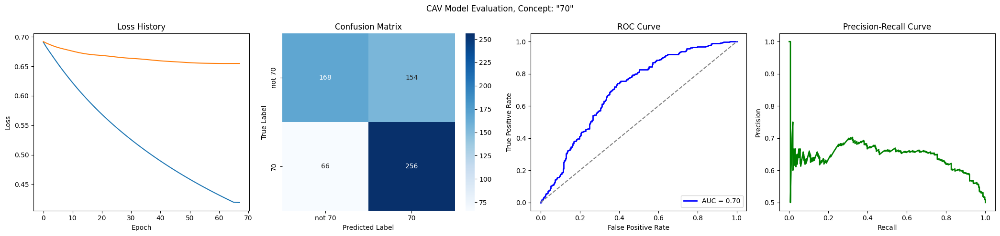

Training run 19/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6987
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6184
Epoch 11 Validation Loss: 0.6730
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5601
Epoch 21 Validation Loss: 0.6598
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5147
Epoch 31 Validation Loss: 0.6524
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4776
Epoch 41 Validation Loss: 0.6468
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4462
Epoch 51 Validation Loss: 0.6422
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4189
Epoch 61 Validation Loss: 0.6388
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

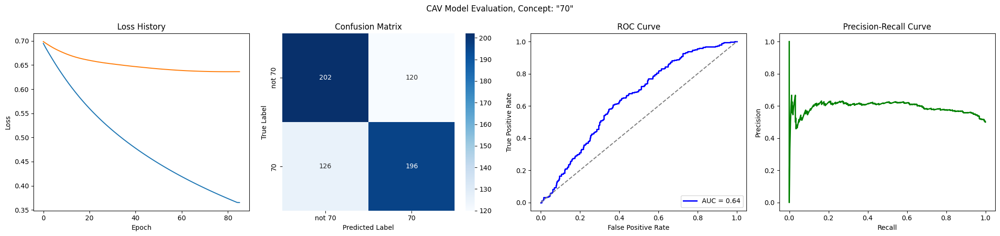

Training run 20/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7091
Epoch 1 Validation Loss: 0.6986
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6533
Epoch 11 Validation Loss: 0.6628
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6136
Epoch 21 Validation Loss: 0.6388
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5781
Epoch 31 Validation Loss: 0.6229
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5462
Epoch 41 Validation Loss: 0.6130
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5174
Epoch 51 Validation Loss: 0.6071
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4913
Epoch 61 Validation Loss: 0.6036
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

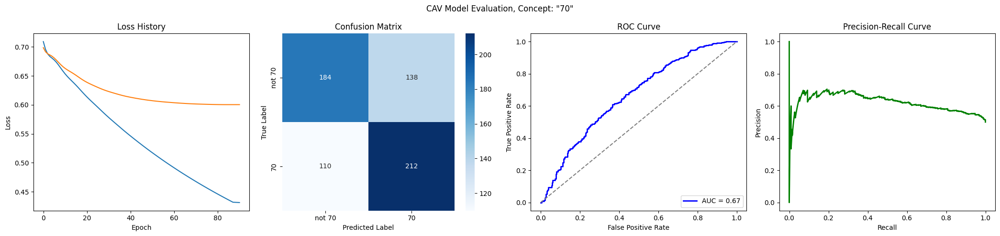

Training run 21/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6900
Epoch 1 Validation Loss: 0.6866
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6153
Epoch 11 Validation Loss: 0.6612
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5603
Epoch 21 Validation Loss: 0.6533
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5218
Epoch 31 Validation Loss: 0.6525
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_70/loss_history.json


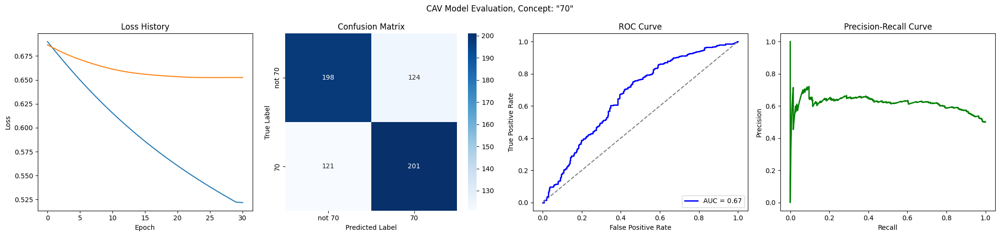

Training run 22/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6406
Epoch 11 Validation Loss: 0.6644
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5952
Epoch 21 Validation Loss: 0.6471
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5565
Epoch 31 Validation Loss: 0.6345
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5226
Epoch 41 Validation Loss: 0.6240
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4925
Epoch 51 Validation Loss: 0.6152
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4656
Epoch 61 Validation Loss: 0.6079
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

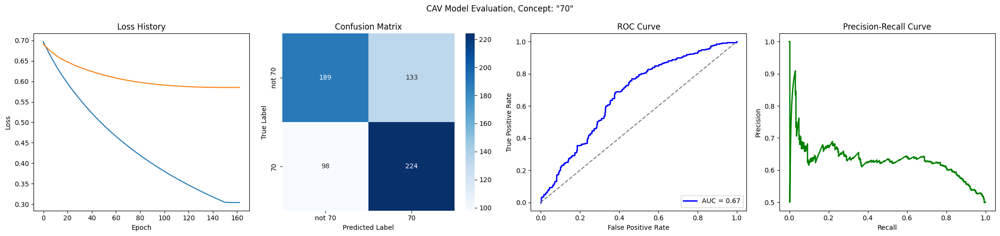

Training run 23/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6996
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6241
Epoch 11 Validation Loss: 0.6603
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5669
Epoch 21 Validation Loss: 0.6453
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5214
Epoch 31 Validation Loss: 0.6392
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4833
Epoch 41 Validation Loss: 0.6367
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4506
Epoch 51 Validation Loss: 0.6360
Early stopping at epoch 54
Loss history saved to trainings/singer_age_decade_70/loss_history.json


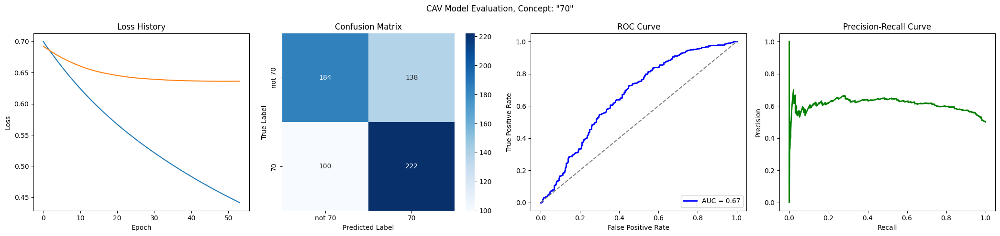

Training run 24/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7000
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6338
Epoch 11 Validation Loss: 0.6456
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5833
Epoch 21 Validation Loss: 0.6182
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5430
Epoch 31 Validation Loss: 0.6038
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5089
Epoch 41 Validation Loss: 0.5957
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4792
Epoch 51 Validation Loss: 0.5906
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4529
Epoch 61 Validation Loss: 0.5867
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

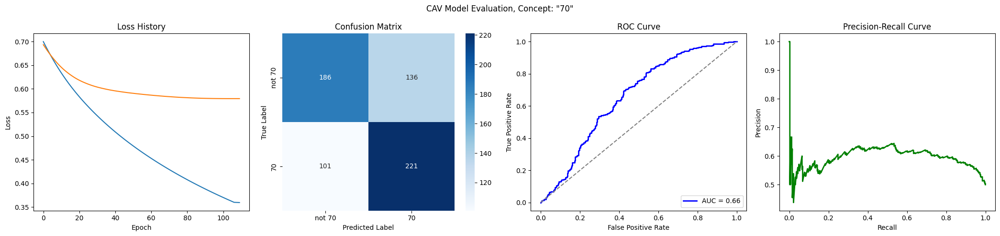

Training run 25/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6310
Epoch 11 Validation Loss: 0.6443
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5787
Epoch 21 Validation Loss: 0.6111
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5374
Epoch 31 Validation Loss: 0.5920
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5023
Epoch 41 Validation Loss: 0.5820
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4716
Epoch 51 Validation Loss: 0.5772
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4446
Epoch 61 Validation Loss: 0.5748
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

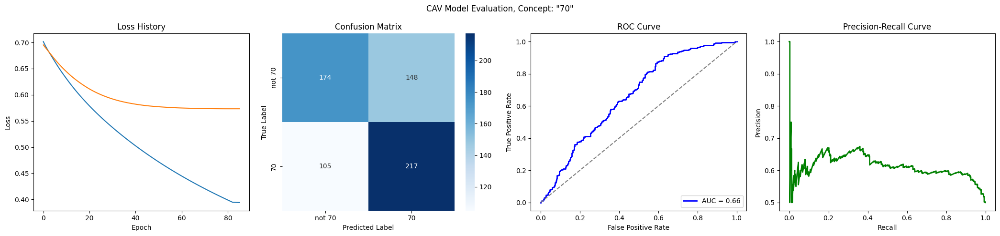

Training run 26/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6996
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6241
Epoch 11 Validation Loss: 0.6561
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5671
Epoch 21 Validation Loss: 0.6373
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5230
Epoch 31 Validation Loss: 0.6267
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4868
Epoch 41 Validation Loss: 0.6193
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4560
Epoch 51 Validation Loss: 0.6134
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4294
Epoch 61 Validation Loss: 0.6087
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

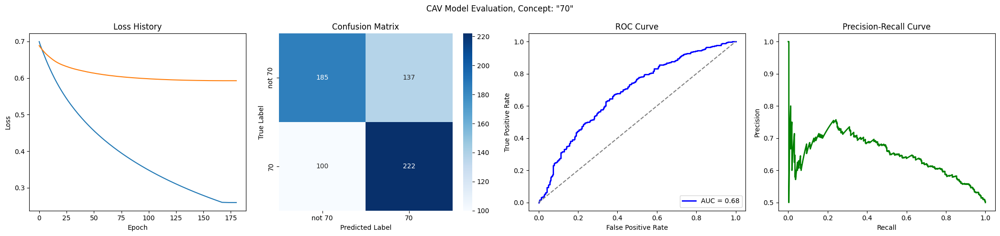

Training run 27/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7005
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6266
Epoch 11 Validation Loss: 0.6596
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5727
Epoch 21 Validation Loss: 0.6370
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5309
Epoch 31 Validation Loss: 0.6225
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4967
Epoch 41 Validation Loss: 0.6123
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4676
Epoch 51 Validation Loss: 0.6051
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4422
Epoch 61 Validation Loss: 0.5998
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

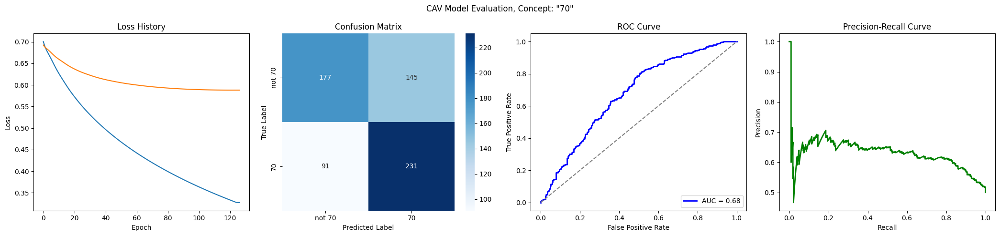

Training run 28/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6365
Epoch 11 Validation Loss: 0.6496
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5899
Epoch 21 Validation Loss: 0.6226
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5503
Epoch 31 Validation Loss: 0.6037
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5160
Epoch 41 Validation Loss: 0.5896
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4860
Epoch 51 Validation Loss: 0.5787
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4592
Epoch 61 Validation Loss: 0.5700
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

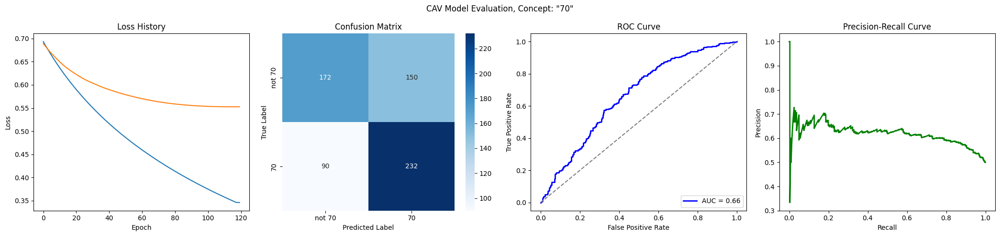

Training run 29/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6906
Epoch 1 Validation Loss: 0.6844
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6253
Epoch 11 Validation Loss: 0.6468
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5745
Epoch 21 Validation Loss: 0.6232
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5334
Epoch 31 Validation Loss: 0.6108
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4986
Epoch 41 Validation Loss: 0.6045
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4681
Epoch 51 Validation Loss: 0.6009
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4410
Epoch 61 Validation Loss: 0.5989
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

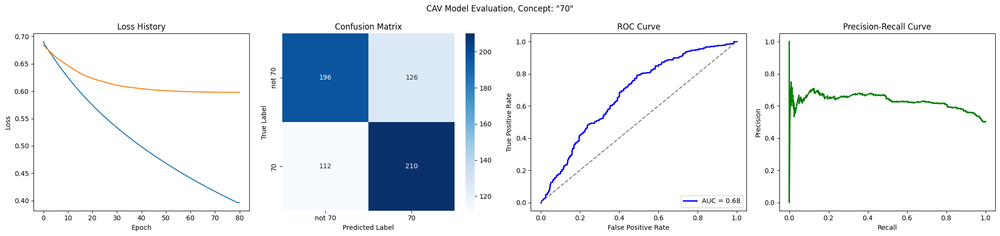

Training run 30/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7003
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6295
Epoch 11 Validation Loss: 0.6575
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5793
Epoch 21 Validation Loss: 0.6374
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5396
Epoch 31 Validation Loss: 0.6250
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5055
Epoch 41 Validation Loss: 0.6164
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4753
Epoch 51 Validation Loss: 0.6103
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4484
Epoch 61 Validation Loss: 0.6062
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

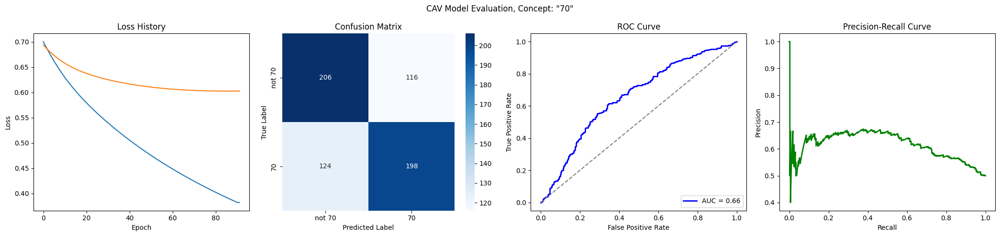

Training run 31/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7004
Epoch 1 Validation Loss: 0.6965
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6258
Epoch 11 Validation Loss: 0.6721
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5700
Epoch 21 Validation Loss: 0.6626
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5277
Epoch 31 Validation Loss: 0.6598
Early stopping at epoch 34
Loss history saved to trainings/singer_age_decade_70/loss_history.json


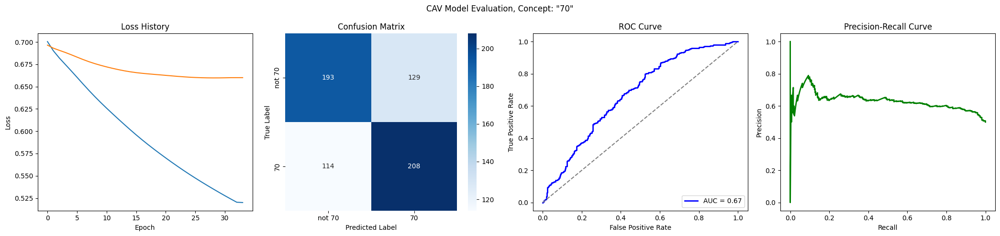

Training run 32/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6880
Epoch 1 Validation Loss: 0.6876
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6292
Epoch 11 Validation Loss: 0.6522
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5808
Epoch 21 Validation Loss: 0.6295
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5399
Epoch 31 Validation Loss: 0.6149
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5040
Epoch 41 Validation Loss: 0.6046
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4723
Epoch 51 Validation Loss: 0.5966
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4439
Epoch 61 Validation Loss: 0.5901
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

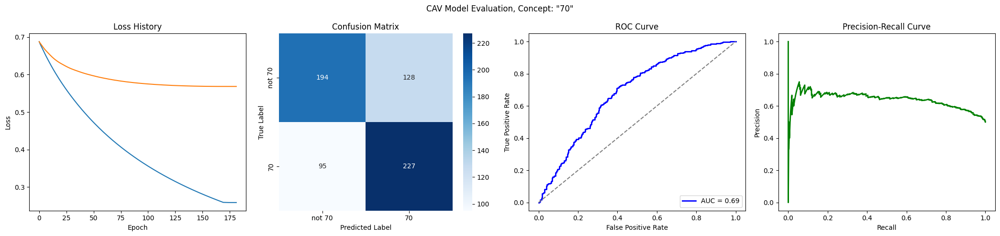

Training run 33/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6277
Epoch 11 Validation Loss: 0.6559
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5757
Epoch 21 Validation Loss: 0.6349
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5342
Epoch 31 Validation Loss: 0.6234
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4994
Epoch 41 Validation Loss: 0.6172
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4694
Epoch 51 Validation Loss: 0.6136
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4431
Epoch 61 Validation Loss: 0.6113
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

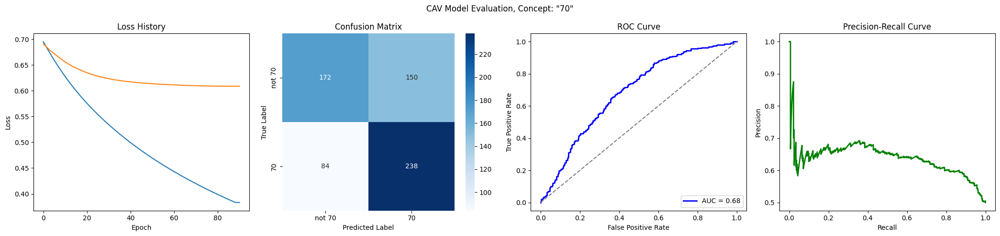

Training run 34/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6898
Epoch 1 Validation Loss: 0.6828
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6096
Epoch 11 Validation Loss: 0.6422
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5501
Epoch 21 Validation Loss: 0.6192
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5044
Epoch 31 Validation Loss: 0.6065
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4672
Epoch 41 Validation Loss: 0.5990
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4357
Epoch 51 Validation Loss: 0.5944
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4084
Epoch 61 Validation Loss: 0.5916
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

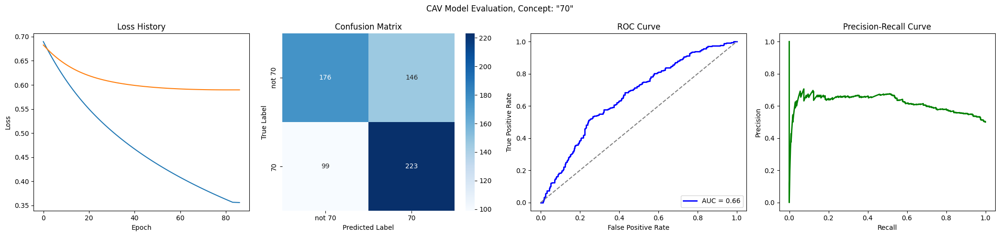

Training run 35/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6911
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6313
Epoch 11 Validation Loss: 0.6625
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5845
Epoch 21 Validation Loss: 0.6461
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5451
Epoch 31 Validation Loss: 0.6362
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5107
Epoch 41 Validation Loss: 0.6295
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4804
Epoch 51 Validation Loss: 0.6243
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4533
Epoch 61 Validation Loss: 0.6198
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

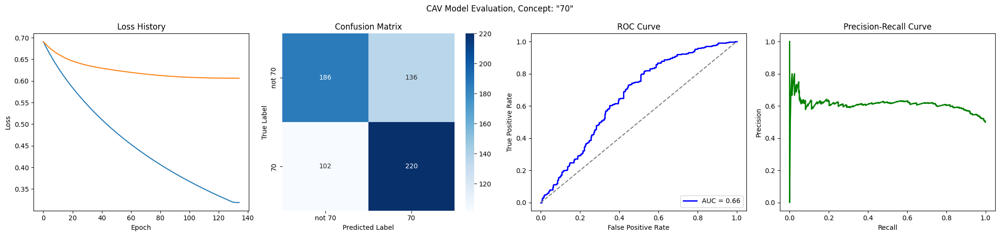

Training run 36/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6961
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6296
Epoch 11 Validation Loss: 0.6610
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5795
Epoch 21 Validation Loss: 0.6415
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5385
Epoch 31 Validation Loss: 0.6298
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5034
Epoch 41 Validation Loss: 0.6213
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4730
Epoch 51 Validation Loss: 0.6144
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4464
Epoch 61 Validation Loss: 0.6084
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

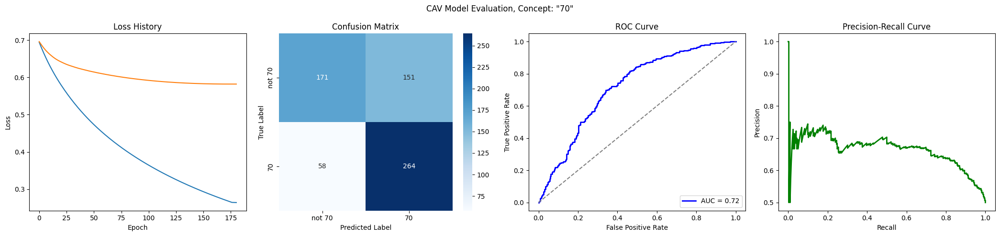

Training run 37/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6919
Epoch 1 Validation Loss: 0.6856
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6106
Epoch 11 Validation Loss: 0.6529
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5522
Epoch 21 Validation Loss: 0.6387
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5086
Epoch 31 Validation Loss: 0.6319
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4735
Epoch 41 Validation Loss: 0.6266
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4435
Epoch 51 Validation Loss: 0.6212
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4171
Epoch 61 Validation Loss: 0.6158
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

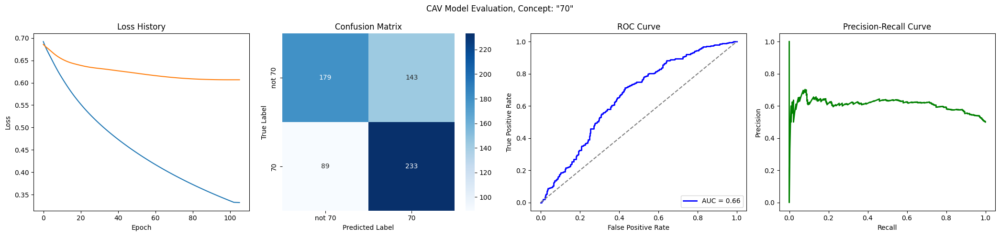

Training run 38/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6928
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6405
Epoch 11 Validation Loss: 0.6761
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5944
Epoch 21 Validation Loss: 0.6646
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5554
Epoch 31 Validation Loss: 0.6583
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5223
Epoch 41 Validation Loss: 0.6551
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4939
Epoch 51 Validation Loss: 0.6538
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4732
Epoch 61 Validation Loss: 0.6537
Early stopping at epoch 61
Loss history saved to trainings/singer_age_decade_70/loss_histor

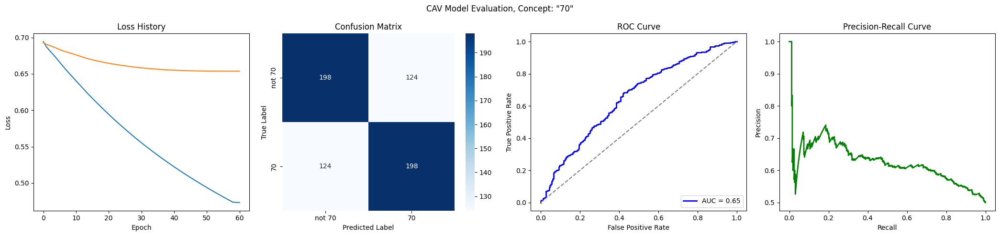

Training run 39/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6819
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6392
Epoch 11 Validation Loss: 0.6378
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5965
Epoch 21 Validation Loss: 0.6135
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5615
Epoch 31 Validation Loss: 0.6013
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5310
Epoch 41 Validation Loss: 0.5950
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5038
Epoch 51 Validation Loss: 0.5910
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4794
Epoch 61 Validation Loss: 0.5880
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

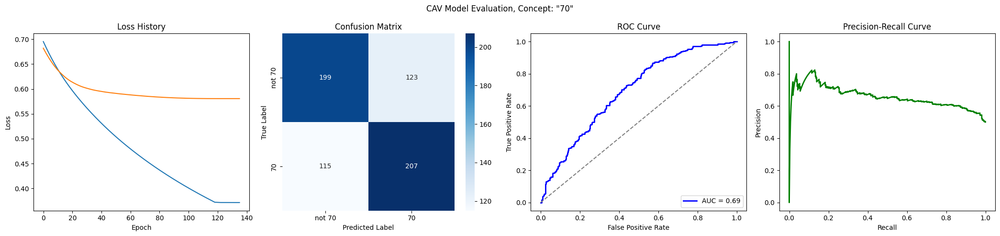

Training run 40/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6193
Epoch 11 Validation Loss: 0.6536
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5629
Epoch 21 Validation Loss: 0.6334
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5194
Epoch 31 Validation Loss: 0.6222
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4846
Epoch 41 Validation Loss: 0.6171
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4552
Epoch 51 Validation Loss: 0.6149
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4296
Epoch 61 Validation Loss: 0.6132
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

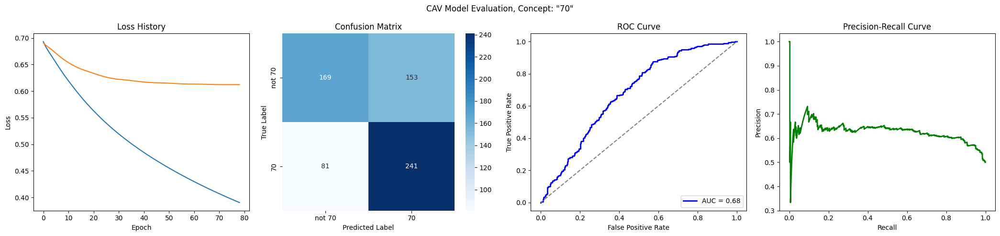

Training run 41/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7061
Epoch 1 Validation Loss: 0.6881
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6251
Epoch 11 Validation Loss: 0.6747
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_70/loss_history.json


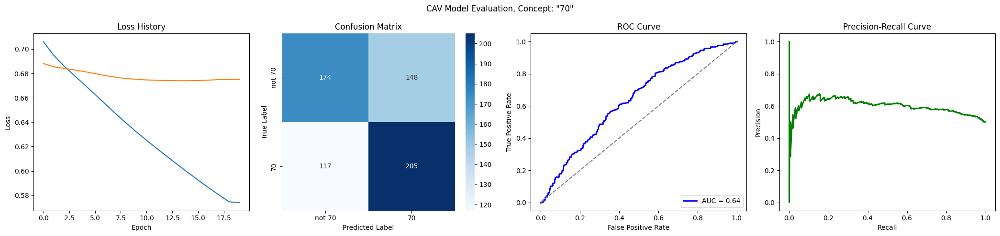

Training run 42/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6362
Epoch 11 Validation Loss: 0.6598
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5900
Epoch 21 Validation Loss: 0.6439
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5502
Epoch 31 Validation Loss: 0.6365
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5153
Epoch 41 Validation Loss: 0.6328
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4847
Epoch 51 Validation Loss: 0.6303
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4574
Epoch 61 Validation Loss: 0.6279
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

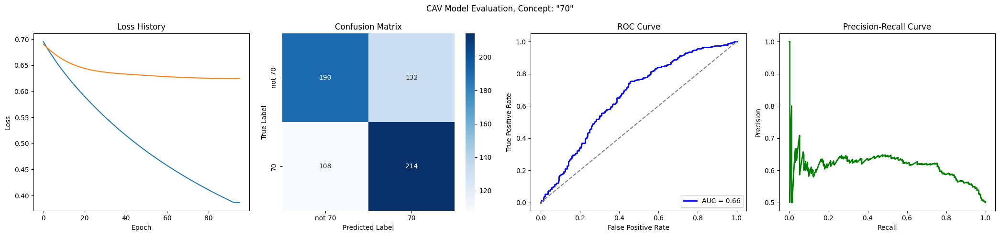

Training run 43/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6886
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6316
Epoch 11 Validation Loss: 0.6543
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5869
Epoch 21 Validation Loss: 0.6326
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5500
Epoch 31 Validation Loss: 0.6184
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5170
Epoch 41 Validation Loss: 0.6082
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4873
Epoch 51 Validation Loss: 0.6010
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4605
Epoch 61 Validation Loss: 0.5957
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

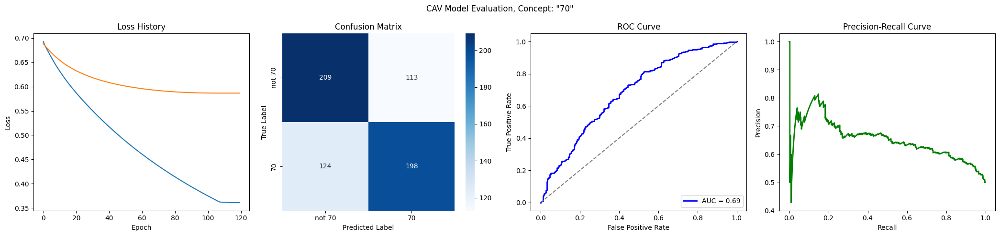

Training run 44/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6879
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6238
Epoch 11 Validation Loss: 0.6590
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5719
Epoch 21 Validation Loss: 0.6442
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5305
Epoch 31 Validation Loss: 0.6375
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4956
Epoch 41 Validation Loss: 0.6345
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4654
Epoch 51 Validation Loss: 0.6333
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4387
Epoch 61 Validation Loss: 0.6329
Early stopping at epoch 65
Loss history saved to trainings/singer_age_decade_70/loss_histor

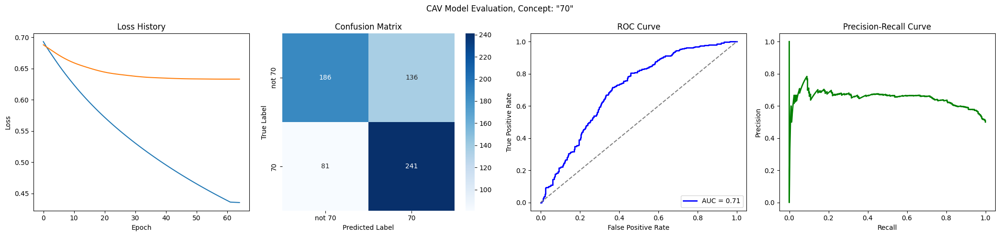

Training run 45/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7021
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6349
Epoch 11 Validation Loss: 0.6703
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5805
Epoch 21 Validation Loss: 0.6547
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5348
Epoch 31 Validation Loss: 0.6422
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4957
Epoch 41 Validation Loss: 0.6320
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4619
Epoch 51 Validation Loss: 0.6244
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4324
Epoch 61 Validation Loss: 0.6193
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

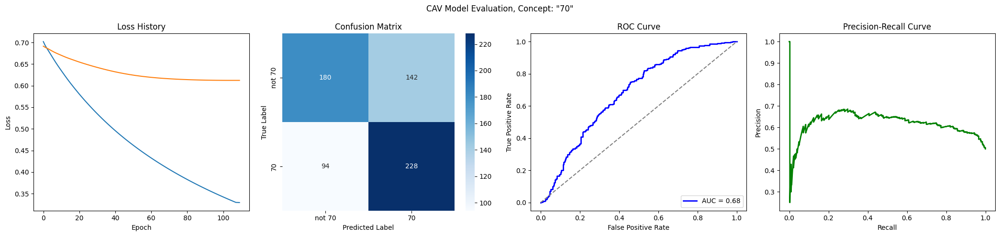

Training run 46/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6262
Epoch 11 Validation Loss: 0.6641
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5728
Epoch 21 Validation Loss: 0.6515
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5312
Epoch 31 Validation Loss: 0.6453
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4965
Epoch 41 Validation Loss: 0.6412
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4667
Epoch 51 Validation Loss: 0.6383
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4407
Epoch 61 Validation Loss: 0.6368
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

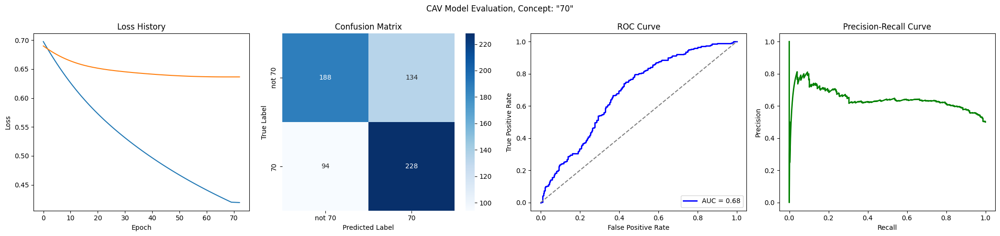

Training run 47/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6161
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5602
Epoch 21 Validation Loss: 0.6785
Early stopping at epoch 24
Loss history saved to trainings/singer_age_decade_70/loss_history.json


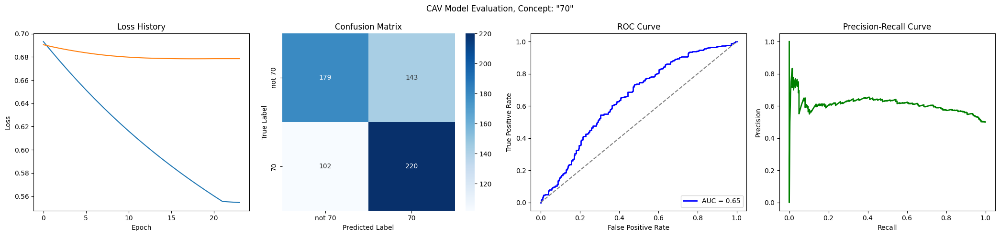

Training run 48/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7033
Epoch 1 Validation Loss: 0.6985
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6424
Epoch 11 Validation Loss: 0.6574
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5967
Epoch 21 Validation Loss: 0.6304
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5579
Epoch 31 Validation Loss: 0.6137
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5239
Epoch 41 Validation Loss: 0.6040
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4934
Epoch 51 Validation Loss: 0.5982
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4661
Epoch 61 Validation Loss: 0.5944
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

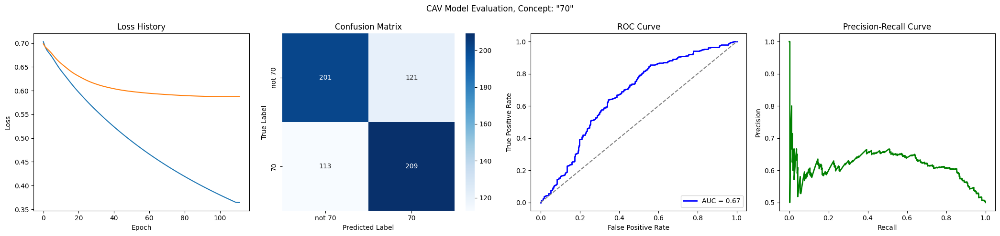

Training run 49/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6389
Epoch 11 Validation Loss: 0.6642
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5939
Epoch 21 Validation Loss: 0.6501
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5563
Epoch 31 Validation Loss: 0.6437
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5232
Epoch 41 Validation Loss: 0.6410
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4938
Epoch 51 Validation Loss: 0.6399
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4675
Epoch 61 Validation Loss: 0.6395
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

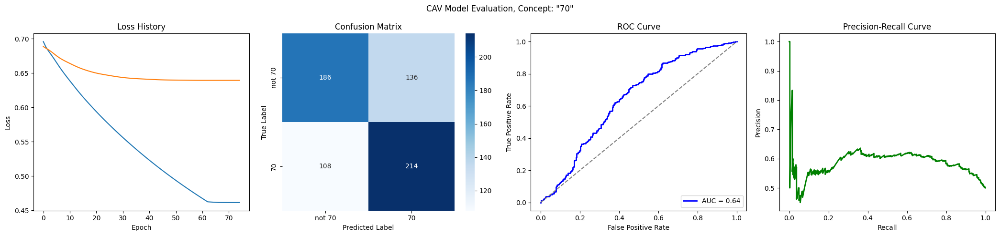

Training run 50/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6915
Epoch 1 Validation Loss: 0.6870
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6227
Epoch 11 Validation Loss: 0.6452
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5732
Epoch 21 Validation Loss: 0.6163
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5349
Epoch 31 Validation Loss: 0.5974
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5027
Epoch 41 Validation Loss: 0.5825
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4745
Epoch 51 Validation Loss: 0.5694
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4492
Epoch 61 Validation Loss: 0.5579
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

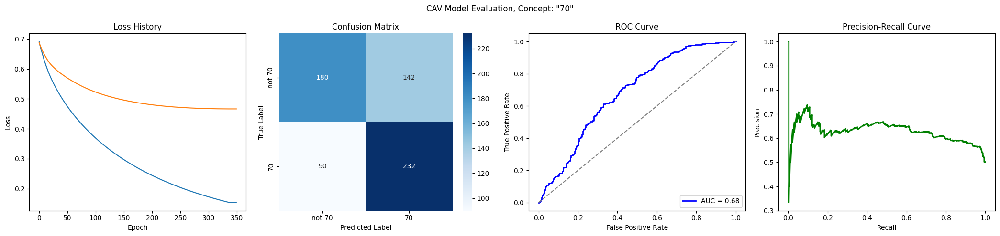

Training run 51/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6841
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6357
Epoch 11 Validation Loss: 0.6629
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5904
Epoch 21 Validation Loss: 0.6507
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5519
Epoch 31 Validation Loss: 0.6440
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5181
Epoch 41 Validation Loss: 0.6413
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_70/loss_history.json


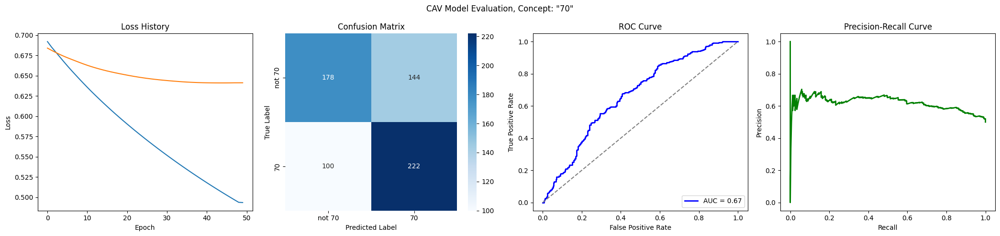

Training run 52/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6977
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6296
Epoch 11 Validation Loss: 0.6641
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5779
Epoch 21 Validation Loss: 0.6486
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5365
Epoch 31 Validation Loss: 0.6394
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5023
Epoch 41 Validation Loss: 0.6333
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4730
Epoch 51 Validation Loss: 0.6280
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4473
Epoch 61 Validation Loss: 0.6231
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

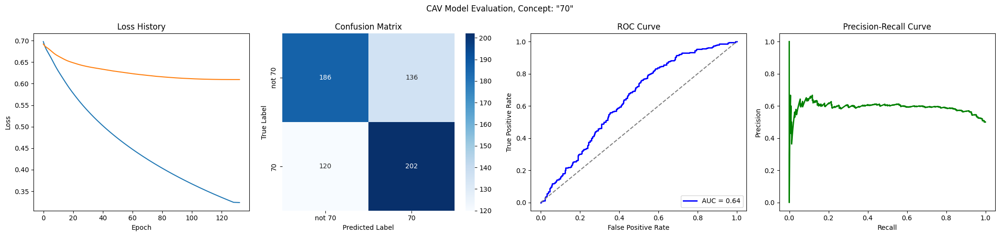

Training run 53/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6367
Epoch 11 Validation Loss: 0.6694
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5895
Epoch 21 Validation Loss: 0.6576
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5489
Epoch 31 Validation Loss: 0.6515
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5137
Epoch 41 Validation Loss: 0.6478
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4830
Epoch 51 Validation Loss: 0.6455
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4560
Epoch 61 Validation Loss: 0.6450
Early stopping at epoch 65
Loss history saved to trainings/singer_age_decade_70/loss_histor

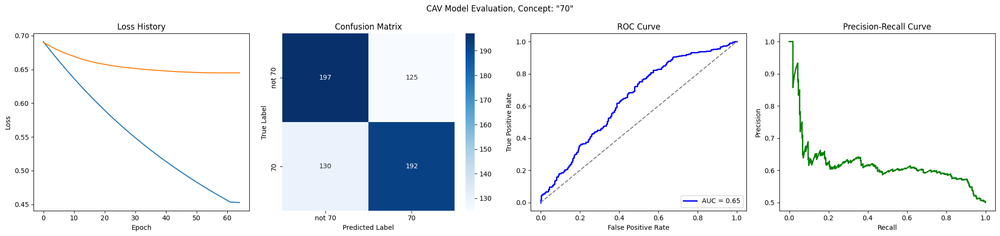

Training run 54/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6354
Epoch 11 Validation Loss: 0.6654
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5858
Epoch 21 Validation Loss: 0.6469
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5445
Epoch 31 Validation Loss: 0.6337
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5093
Epoch 41 Validation Loss: 0.6241
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4790
Epoch 51 Validation Loss: 0.6173
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4524
Epoch 61 Validation Loss: 0.6127
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

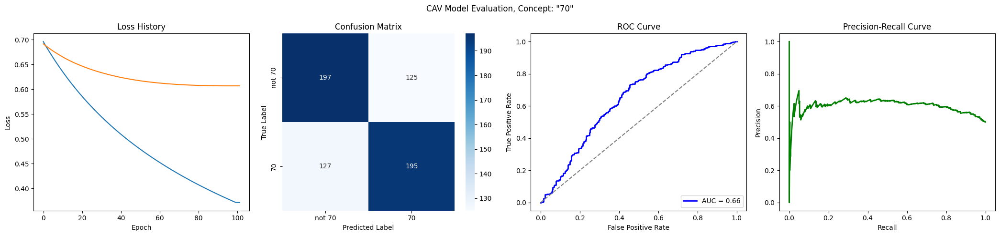

Training run 55/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6851
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6345
Epoch 11 Validation Loss: 0.6527
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5879
Epoch 21 Validation Loss: 0.6328
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5488
Epoch 31 Validation Loss: 0.6208
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5151
Epoch 41 Validation Loss: 0.6131
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4858
Epoch 51 Validation Loss: 0.6076
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4599
Epoch 61 Validation Loss: 0.6032
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

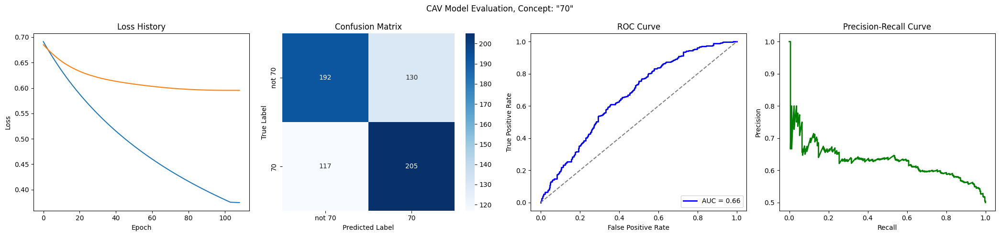

Training run 56/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6866
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6328
Epoch 11 Validation Loss: 0.6424
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5861
Epoch 21 Validation Loss: 0.6167
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5470
Epoch 31 Validation Loss: 0.6042
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5132
Epoch 41 Validation Loss: 0.5984
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4835
Epoch 51 Validation Loss: 0.5944
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4569
Epoch 61 Validation Loss: 0.5903
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

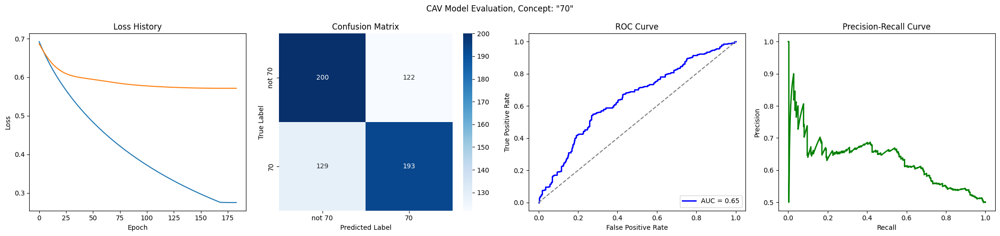

Training run 57/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6884
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6378
Epoch 11 Validation Loss: 0.6576
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5930
Epoch 21 Validation Loss: 0.6371
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5543
Epoch 31 Validation Loss: 0.6253
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5201
Epoch 41 Validation Loss: 0.6196
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4898
Epoch 51 Validation Loss: 0.6179
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/singer_age_decade_70/loss_history.json


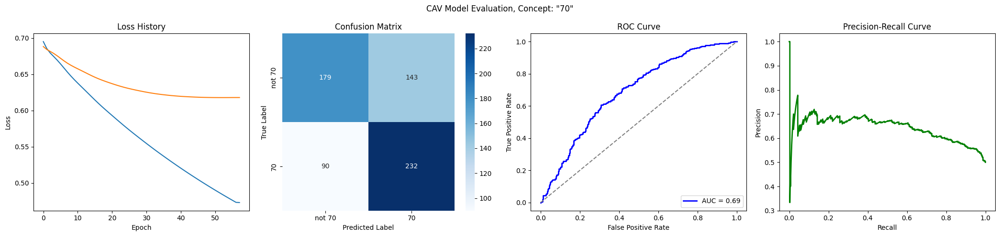

Training run 58/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6362
Epoch 11 Validation Loss: 0.6706
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5899
Epoch 21 Validation Loss: 0.6619
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5512
Epoch 31 Validation Loss: 0.6577
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5177
Epoch 41 Validation Loss: 0.6566
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4882
Epoch 51 Validation Loss: 0.6560
Early stopping at epoch 54
Loss history saved to trainings/singer_age_decade_70/loss_history.json


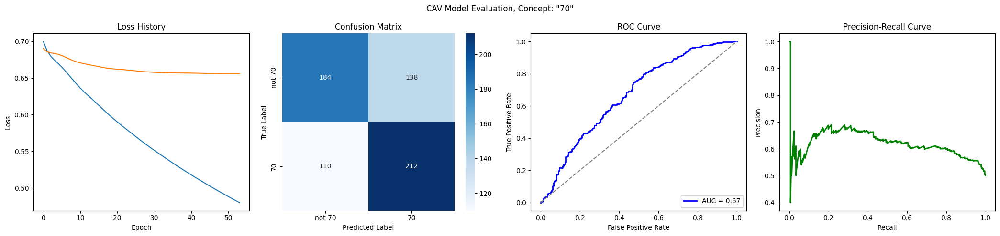

Training run 59/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7008
Epoch 1 Validation Loss: 0.6986
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6342
Epoch 11 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5810
Epoch 21 Validation Loss: 0.6649
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5369
Epoch 31 Validation Loss: 0.6629
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 36
Loss history saved to trainings/singer_age_decade_70/loss_history.json


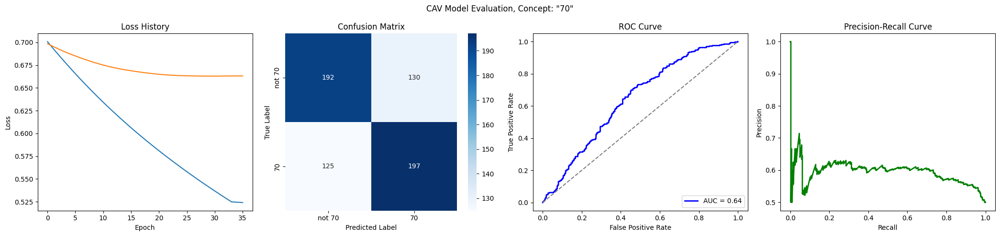

Training run 60/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6914
Epoch 1 Validation Loss: 0.6832
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6248
Epoch 11 Validation Loss: 0.6387
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5734
Epoch 21 Validation Loss: 0.6107
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5319
Epoch 31 Validation Loss: 0.5936
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4971
Epoch 41 Validation Loss: 0.5829
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4674
Epoch 51 Validation Loss: 0.5760
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4415
Epoch 61 Validation Loss: 0.5713
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

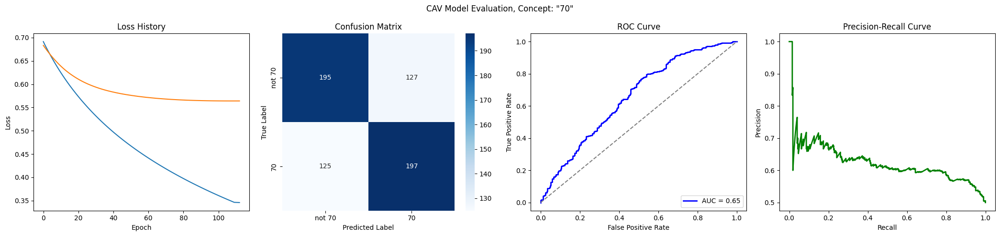

Training run 61/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6515
Epoch 11 Validation Loss: 0.6698
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6089
Epoch 21 Validation Loss: 0.6538
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5702
Epoch 31 Validation Loss: 0.6442
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5358
Epoch 41 Validation Loss: 0.6377
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5052
Epoch 51 Validation Loss: 0.6336
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4779
Epoch 61 Validation Loss: 0.6317
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

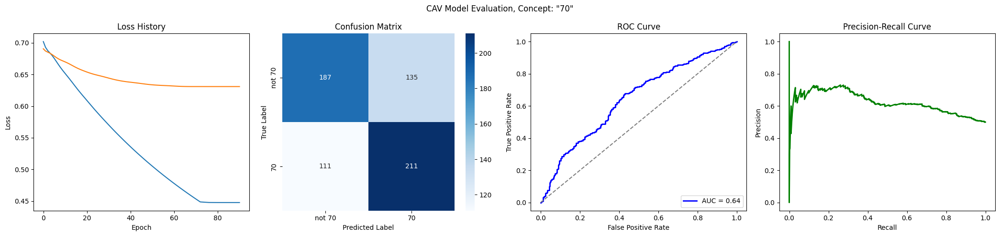

Training run 62/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6909
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6282
Epoch 11 Validation Loss: 0.6599
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5788
Epoch 21 Validation Loss: 0.6451
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5376
Epoch 31 Validation Loss: 0.6393
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5015
Epoch 41 Validation Loss: 0.6377
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/singer_age_decade_70/loss_history.json


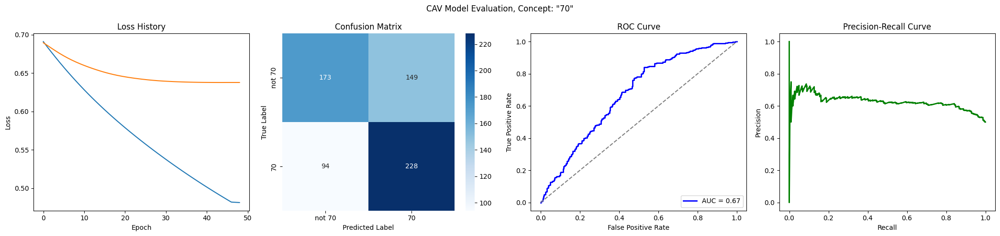

Training run 63/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6385
Epoch 11 Validation Loss: 0.6561
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5909
Epoch 21 Validation Loss: 0.6336
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5512
Epoch 31 Validation Loss: 0.6217
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5172
Epoch 41 Validation Loss: 0.6156
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4875
Epoch 51 Validation Loss: 0.6122
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4612
Epoch 61 Validation Loss: 0.6101
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

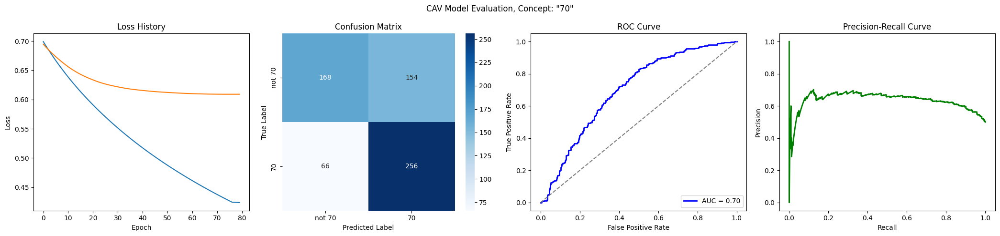

Training run 64/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7011
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6410
Epoch 11 Validation Loss: 0.6567
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5909
Epoch 21 Validation Loss: 0.6323
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5478
Epoch 31 Validation Loss: 0.6178
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5104
Epoch 41 Validation Loss: 0.6099
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4775
Epoch 51 Validation Loss: 0.6059
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4483
Epoch 61 Validation Loss: 0.6038
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

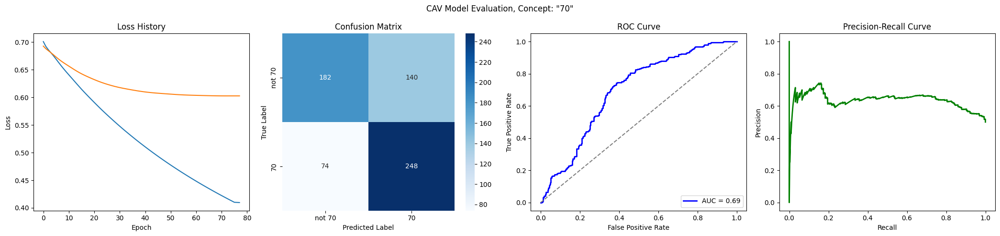

Training run 65/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7012
Epoch 1 Validation Loss: 0.6964
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6538
Epoch 11 Validation Loss: 0.6668
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6151
Epoch 21 Validation Loss: 0.6444
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5795
Epoch 31 Validation Loss: 0.6309
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5471
Epoch 41 Validation Loss: 0.6212
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5180
Epoch 51 Validation Loss: 0.6141
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4917
Epoch 61 Validation Loss: 0.6079
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

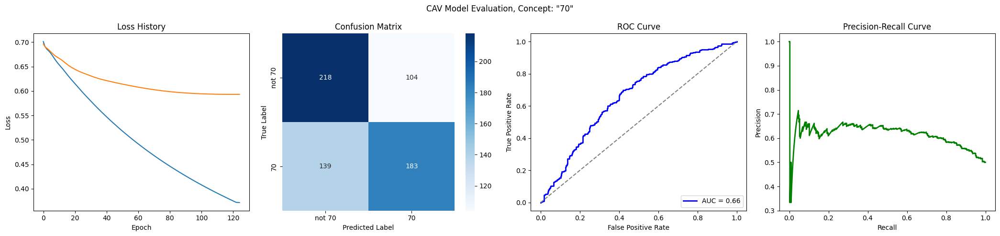

Training run 66/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6996
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6463
Epoch 11 Validation Loss: 0.6606
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6052
Epoch 21 Validation Loss: 0.6366
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5689
Epoch 31 Validation Loss: 0.6176
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5364
Epoch 41 Validation Loss: 0.6031
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5073
Epoch 51 Validation Loss: 0.5907
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4811
Epoch 61 Validation Loss: 0.5797
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

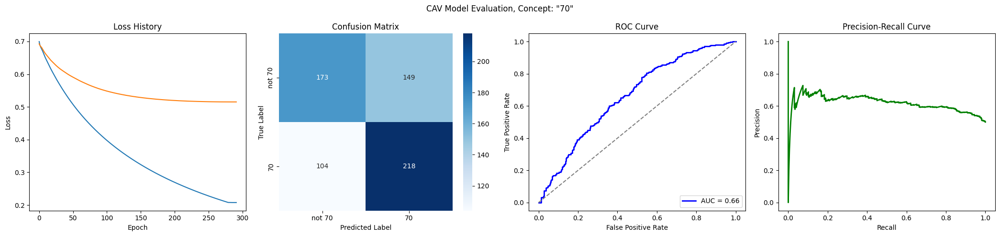

Training run 67/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6840
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6300
Epoch 11 Validation Loss: 0.6560
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5803
Epoch 21 Validation Loss: 0.6430
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5405
Epoch 31 Validation Loss: 0.6378
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5059
Epoch 41 Validation Loss: 0.6362
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_70/loss_history.json


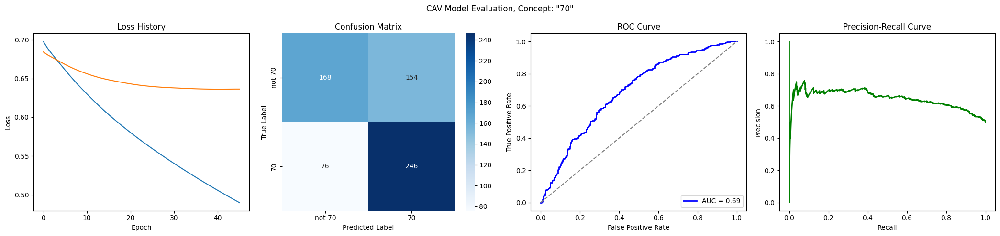

Training run 68/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6889
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6313
Epoch 11 Validation Loss: 0.6540
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5815
Epoch 21 Validation Loss: 0.6339
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5417
Epoch 31 Validation Loss: 0.6238
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5083
Epoch 41 Validation Loss: 0.6191
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4791
Epoch 51 Validation Loss: 0.6171
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4532
Epoch 61 Validation Loss: 0.6168
Early stopping at epoch 62
Loss history saved to trainings/singer_age_decade_70/loss_histor

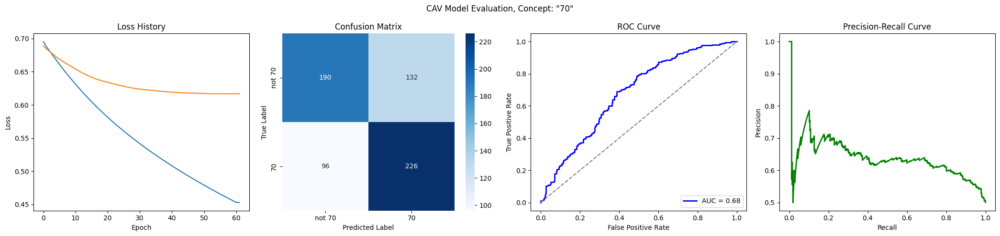

Training run 69/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7052
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6331
Epoch 11 Validation Loss: 0.6846
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_70/loss_history.json


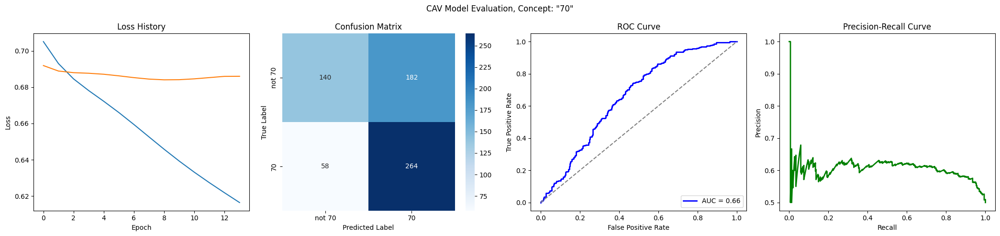

Training run 70/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6887
Epoch 1 Validation Loss: 0.6876
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6254
Epoch 11 Validation Loss: 0.6548
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5740
Epoch 21 Validation Loss: 0.6345
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5313
Epoch 31 Validation Loss: 0.6224
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4949
Epoch 41 Validation Loss: 0.6149
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4633
Epoch 51 Validation Loss: 0.6100
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4356
Epoch 61 Validation Loss: 0.6064
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

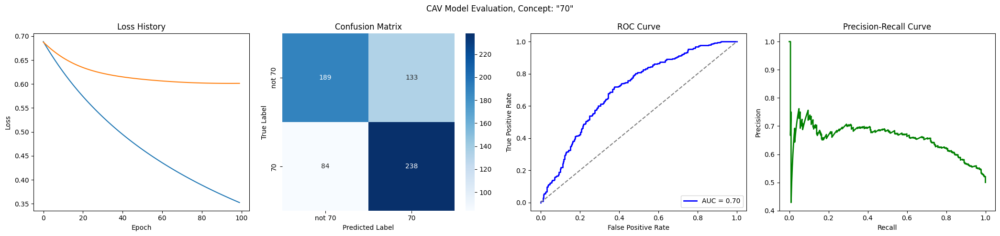

Training run 71/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6396
Epoch 11 Validation Loss: 0.6613
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5939
Epoch 21 Validation Loss: 0.6448
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5544
Epoch 31 Validation Loss: 0.6369
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5195
Epoch 41 Validation Loss: 0.6336
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4886
Epoch 51 Validation Loss: 0.6320
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4609
Epoch 61 Validation Loss: 0.6305
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

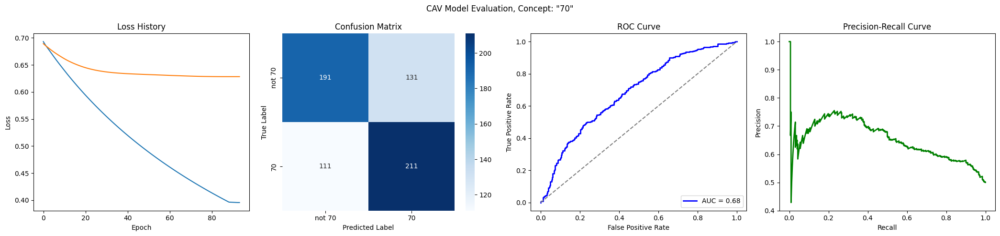

Training run 72/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6330
Epoch 11 Validation Loss: 0.6692
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5870
Epoch 21 Validation Loss: 0.6582
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5497
Epoch 31 Validation Loss: 0.6517
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5178
Epoch 41 Validation Loss: 0.6472
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4903
Epoch 51 Validation Loss: 0.6444
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4661
Epoch 61 Validation Loss: 0.6428
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

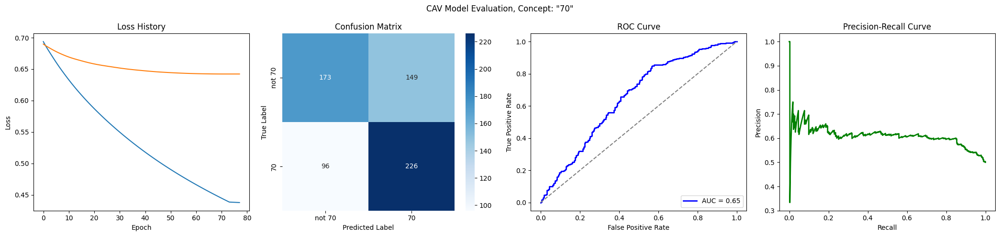

Training run 73/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7067
Epoch 1 Validation Loss: 0.6958
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6315
Epoch 11 Validation Loss: 0.6691
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5754
Epoch 21 Validation Loss: 0.6561
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5312
Epoch 31 Validation Loss: 0.6519
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4950
Epoch 41 Validation Loss: 0.6515
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_70/loss_history.json


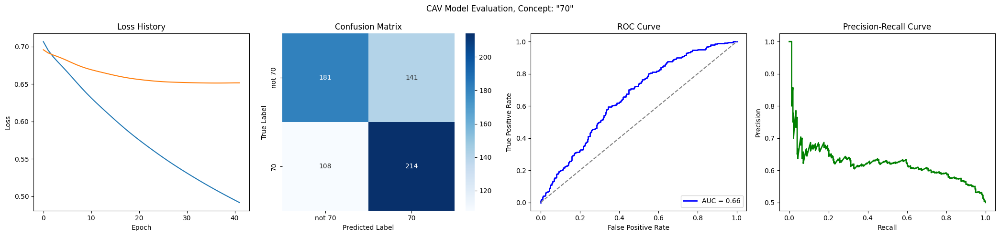

Training run 74/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6914
Epoch 1 Validation Loss: 0.6881
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6431
Epoch 11 Validation Loss: 0.6677
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6008
Epoch 21 Validation Loss: 0.6515
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5642
Epoch 31 Validation Loss: 0.6388
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5322
Epoch 41 Validation Loss: 0.6289
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5038
Epoch 51 Validation Loss: 0.6211
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4782
Epoch 61 Validation Loss: 0.6152
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

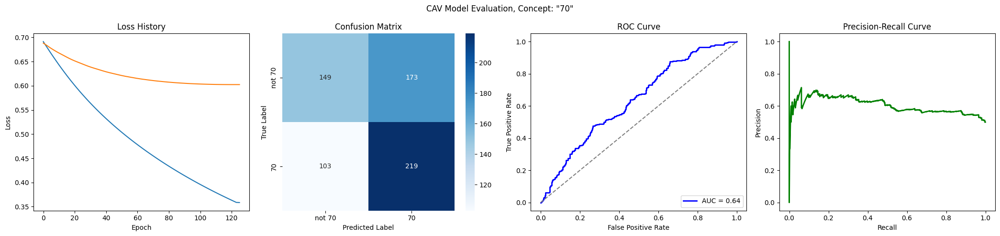

Training run 75/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6295
Epoch 11 Validation Loss: 0.6638
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5797
Epoch 21 Validation Loss: 0.6509
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5413
Epoch 31 Validation Loss: 0.6480
Early stopping at epoch 35
Loss history saved to trainings/singer_age_decade_70/loss_history.json


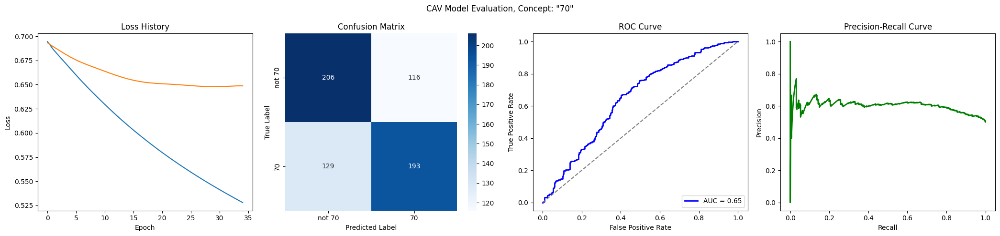

Training run 76/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6241
Epoch 11 Validation Loss: 0.6545
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5708
Epoch 21 Validation Loss: 0.6337
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5302
Epoch 31 Validation Loss: 0.6229
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4974
Epoch 41 Validation Loss: 0.6172
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4697
Epoch 51 Validation Loss: 0.6134
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4454
Epoch 61 Validation Loss: 0.6106
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

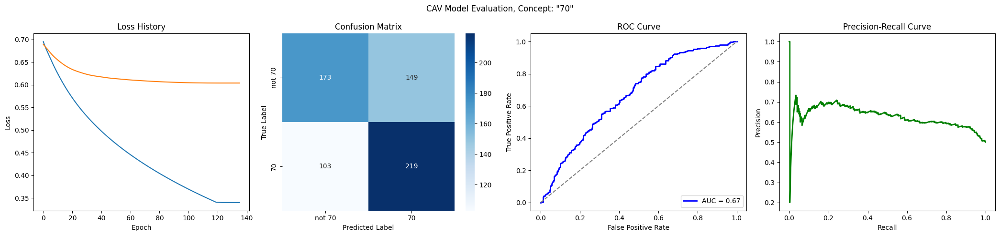

Training run 77/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6193
Epoch 11 Validation Loss: 0.6535
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5609
Epoch 21 Validation Loss: 0.6310
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5152
Epoch 31 Validation Loss: 0.6174
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4781
Epoch 41 Validation Loss: 0.6086
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4470
Epoch 51 Validation Loss: 0.6028
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4200
Epoch 61 Validation Loss: 0.5991
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

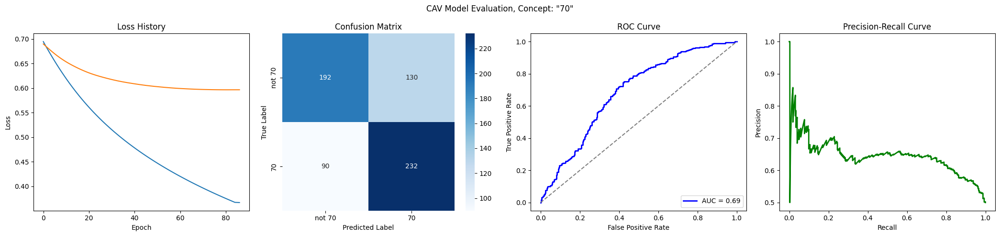

Training run 78/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6295
Epoch 11 Validation Loss: 0.6596
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5767
Epoch 21 Validation Loss: 0.6388
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5331
Epoch 31 Validation Loss: 0.6274
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4958
Epoch 41 Validation Loss: 0.6218
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4634
Epoch 51 Validation Loss: 0.6189
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4350
Epoch 61 Validation Loss: 0.6172
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

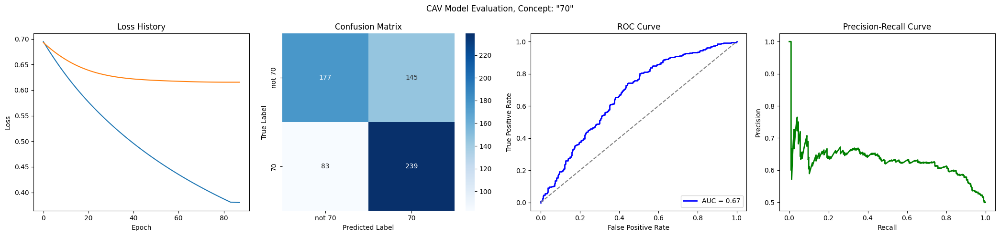

Training run 79/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6259
Epoch 11 Validation Loss: 0.6869
Early stopping at epoch 14
Loss history saved to trainings/singer_age_decade_70/loss_history.json


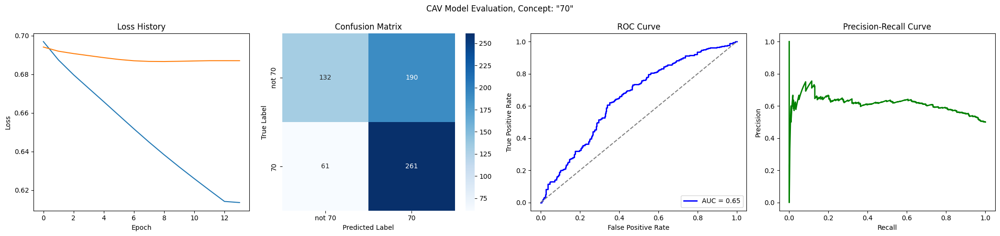

Training run 80/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6218
Epoch 11 Validation Loss: 0.6547
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5664
Epoch 21 Validation Loss: 0.6339
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5244
Epoch 31 Validation Loss: 0.6197
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4900
Epoch 41 Validation Loss: 0.6074
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4604
Epoch 51 Validation Loss: 0.5956
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4342
Epoch 61 Validation Loss: 0.5848
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

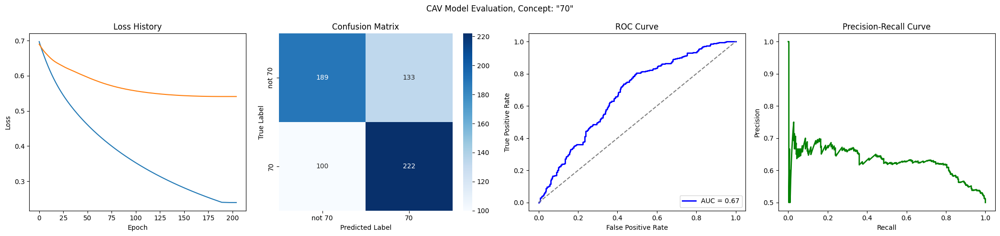

Training run 81/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6364
Epoch 11 Validation Loss: 0.6623
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5893
Epoch 21 Validation Loss: 0.6456
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5496
Epoch 31 Validation Loss: 0.6354
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5148
Epoch 41 Validation Loss: 0.6306
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4840
Epoch 51 Validation Loss: 0.6277
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4567
Epoch 61 Validation Loss: 0.6264
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 67
Los

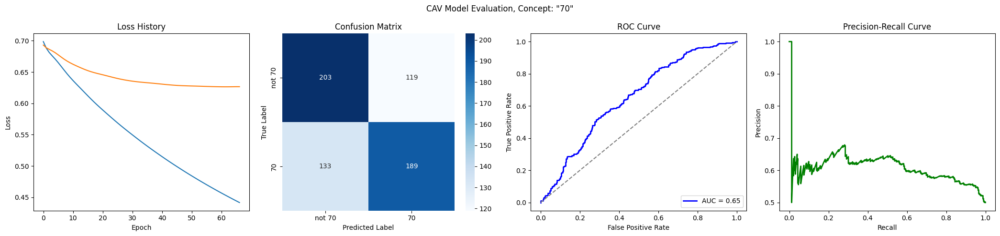

Training run 82/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6880
Epoch 1 Validation Loss: 0.6802
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6147
Epoch 11 Validation Loss: 0.6488
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5582
Epoch 21 Validation Loss: 0.6304
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5140
Epoch 31 Validation Loss: 0.6203
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4779
Epoch 41 Validation Loss: 0.6143
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4473
Epoch 51 Validation Loss: 0.6101
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4206
Epoch 61 Validation Loss: 0.6069
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

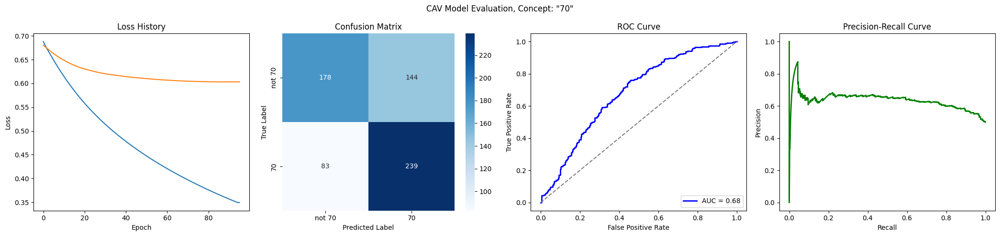

Training run 83/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6286
Epoch 11 Validation Loss: 0.6718
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5817
Epoch 21 Validation Loss: 0.6626
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5434
Epoch 31 Validation Loss: 0.6583
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5100
Epoch 41 Validation Loss: 0.6566
Model saved to trainings/singer_age_decade_70/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/singer_age_decade_70/loss_history.json


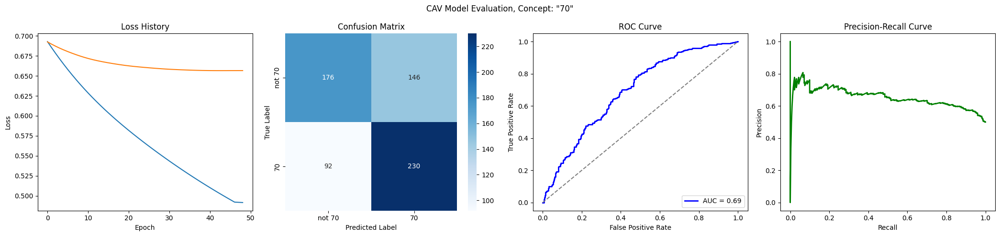

Training run 84/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6216
Epoch 11 Validation Loss: 0.6653
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5676
Epoch 21 Validation Loss: 0.6522
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5264
Epoch 31 Validation Loss: 0.6450
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4928
Epoch 41 Validation Loss: 0.6395
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4646
Epoch 51 Validation Loss: 0.6350
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4403
Epoch 61 Validation Loss: 0.6317
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

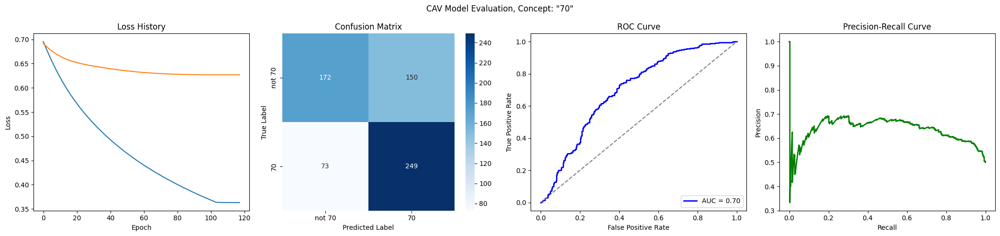

Training run 85/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6875
Epoch 1 Validation Loss: 0.6884
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6100
Epoch 11 Validation Loss: 0.6499
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5537
Epoch 21 Validation Loss: 0.6256
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5112
Epoch 31 Validation Loss: 0.6088
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4764
Epoch 41 Validation Loss: 0.5953
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4465
Epoch 51 Validation Loss: 0.5838
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4201
Epoch 61 Validation Loss: 0.5742
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

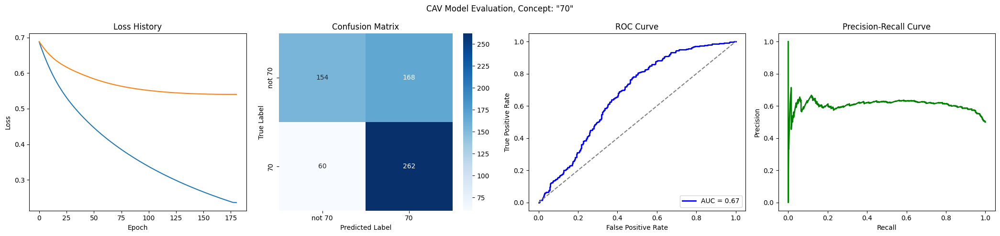

Training run 86/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6893
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6262
Epoch 11 Validation Loss: 0.6443
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5786
Epoch 21 Validation Loss: 0.6171
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5407
Epoch 31 Validation Loss: 0.6028
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5084
Epoch 41 Validation Loss: 0.5948
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4801
Epoch 51 Validation Loss: 0.5894
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4547
Epoch 61 Validation Loss: 0.5849
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

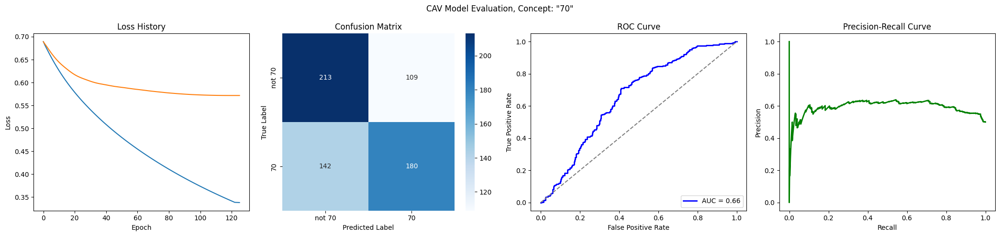

Training run 87/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6890
Epoch 1 Validation Loss: 0.6821
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6318
Epoch 11 Validation Loss: 0.6432
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5867
Epoch 21 Validation Loss: 0.6197
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5478
Epoch 31 Validation Loss: 0.6072
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5133
Epoch 41 Validation Loss: 0.5994
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4826
Epoch 51 Validation Loss: 0.5924
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4549
Epoch 61 Validation Loss: 0.5853
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

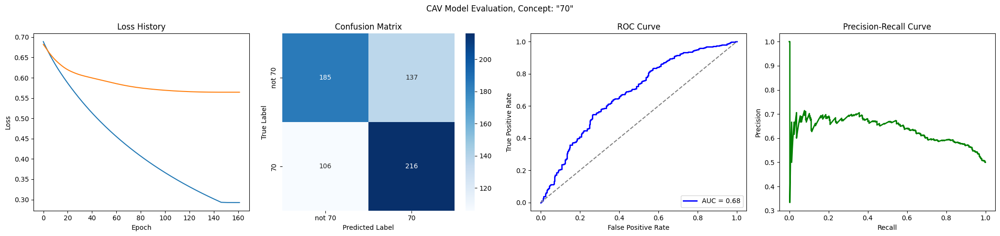

Training run 88/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6872
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6431
Epoch 11 Validation Loss: 0.6626
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6014
Epoch 21 Validation Loss: 0.6469
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5647
Epoch 31 Validation Loss: 0.6370
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5322
Epoch 41 Validation Loss: 0.6319
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5031
Epoch 51 Validation Loss: 0.6286
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4770
Epoch 61 Validation Loss: 0.6258
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

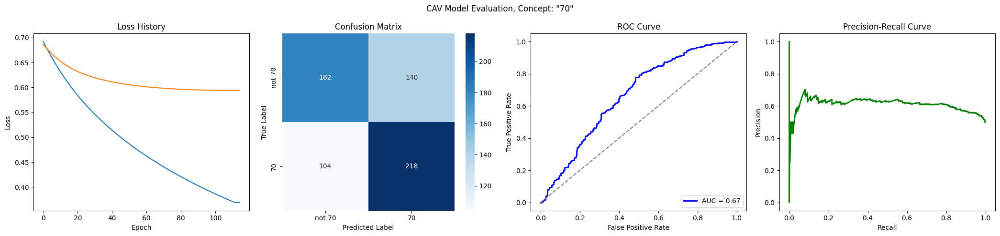

Training run 93/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6876
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6269
Epoch 11 Validation Loss: 0.6511
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5754
Epoch 21 Validation Loss: 0.6291
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5338
Epoch 31 Validation Loss: 0.6171
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4988
Epoch 41 Validation Loss: 0.6105
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4684
Epoch 51 Validation Loss: 0.6061
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4417
Epoch 61 Validation Loss: 0.6026
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

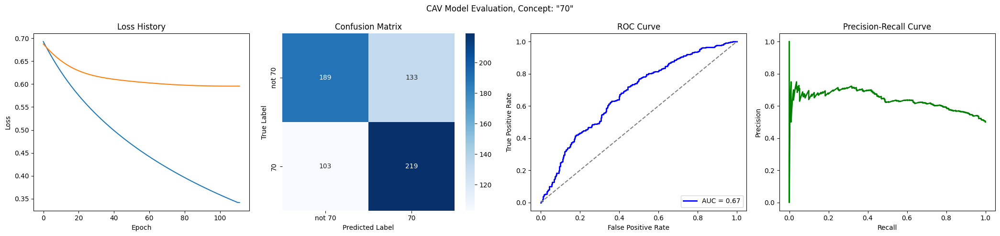

Training run 94/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6401
Epoch 11 Validation Loss: 0.6737
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5942
Epoch 21 Validation Loss: 0.6603
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5545
Epoch 31 Validation Loss: 0.6495
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5199
Epoch 41 Validation Loss: 0.6415
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4893
Epoch 51 Validation Loss: 0.6357
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4620
Epoch 61 Validation Loss: 0.6315
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

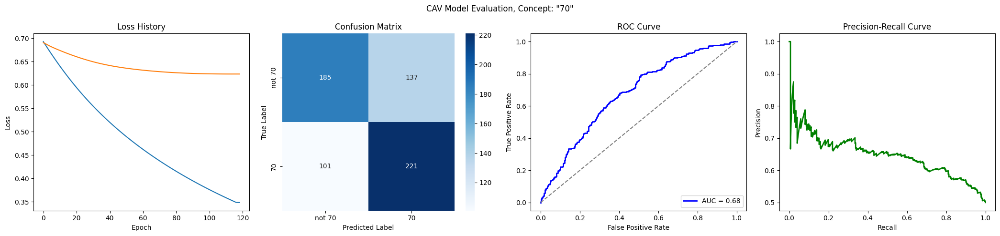

Training run 95/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7007
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6396
Epoch 11 Validation Loss: 0.6625
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5920
Epoch 21 Validation Loss: 0.6421
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5528
Epoch 31 Validation Loss: 0.6295
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5190
Epoch 41 Validation Loss: 0.6205
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4891
Epoch 51 Validation Loss: 0.6139
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4624
Epoch 61 Validation Loss: 0.6103
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

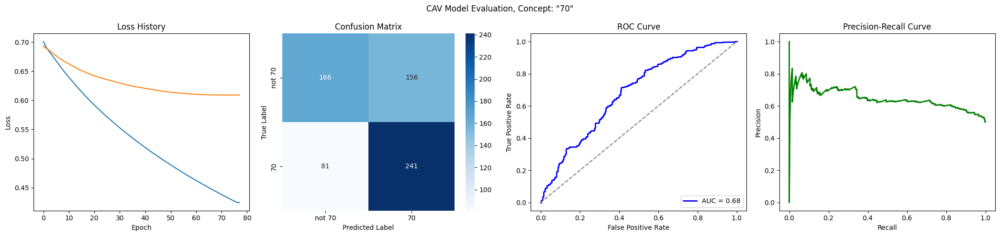

Training run 96/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6854
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6420
Epoch 11 Validation Loss: 0.6562
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5972
Epoch 21 Validation Loss: 0.6397
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5592
Epoch 31 Validation Loss: 0.6304
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5263
Epoch 41 Validation Loss: 0.6263
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4975
Epoch 51 Validation Loss: 0.6239
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4719
Epoch 61 Validation Loss: 0.6217
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

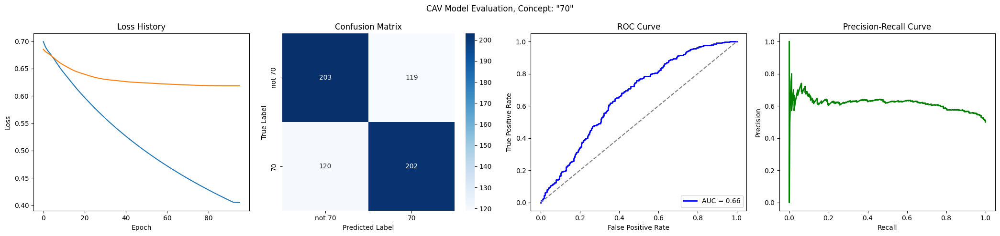

Training run 97/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6887
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6394
Epoch 11 Validation Loss: 0.6634
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5938
Epoch 21 Validation Loss: 0.6477
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5548
Epoch 31 Validation Loss: 0.6376
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5209
Epoch 41 Validation Loss: 0.6321
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4914
Epoch 51 Validation Loss: 0.6288
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4654
Epoch 61 Validation Loss: 0.6269
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

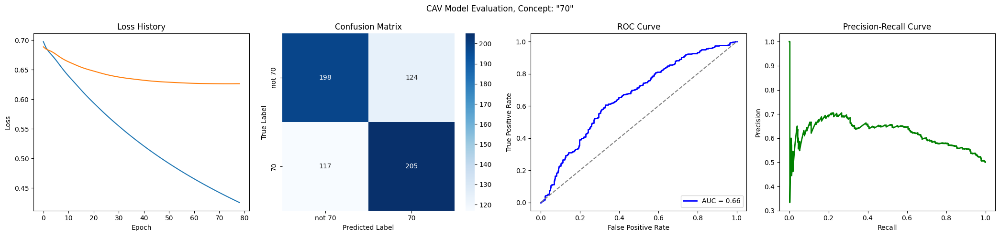

Training run 98/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6950
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6359
Epoch 11 Validation Loss: 0.6611
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5869
Epoch 21 Validation Loss: 0.6426
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5454
Epoch 31 Validation Loss: 0.6312
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5095
Epoch 41 Validation Loss: 0.6242
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4779
Epoch 51 Validation Loss: 0.6194
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4499
Epoch 61 Validation Loss: 0.6156
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

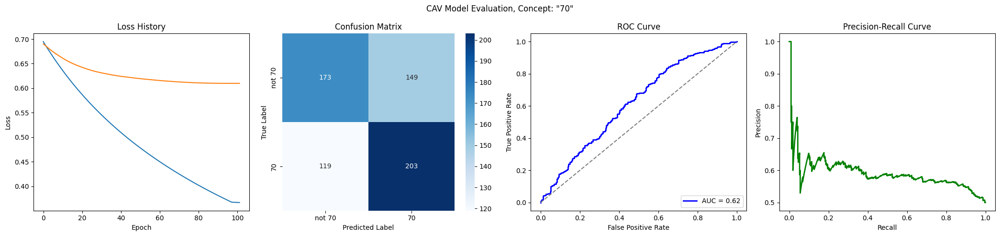

Training run 99/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6988
Epoch 1 Validation Loss: 0.6981
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6334
Epoch 11 Validation Loss: 0.6714
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5863
Epoch 21 Validation Loss: 0.6556
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5501
Epoch 31 Validation Loss: 0.6439
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5192
Epoch 41 Validation Loss: 0.6336
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4918
Epoch 51 Validation Loss: 0.6250
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4674
Epoch 61 Validation Loss: 0.6186
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

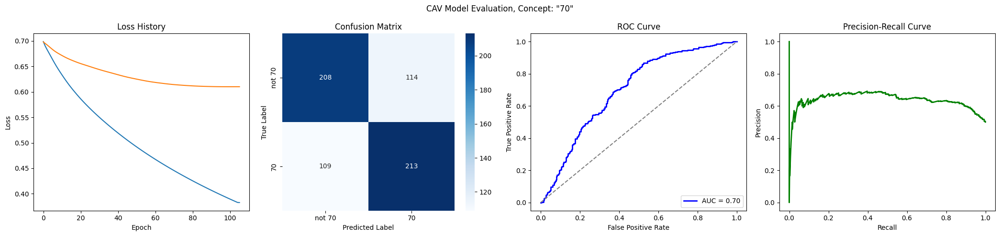

Training run 100/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6991
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6360
Epoch 11 Validation Loss: 0.6569
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5845
Epoch 21 Validation Loss: 0.6375
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5412
Epoch 31 Validation Loss: 0.6279
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5043
Epoch 41 Validation Loss: 0.6233
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4724
Epoch 51 Validation Loss: 0.6209
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4444
Epoch 61 Validation Loss: 0.6194
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train L

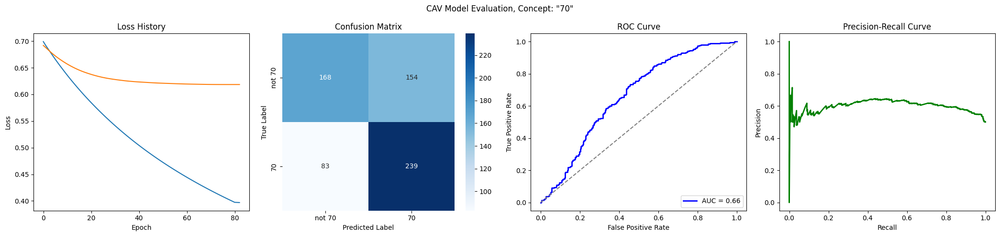

CPU times: user 14min 25s, sys: 10min 21s, total: 24min 47s
Wall time: 1h 42min 25s


In [ ]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [ ]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [ ]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [ ]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [ ]:
validation_sample_count

36

In [ ]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


316 36
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6857
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6007
Epoch 11 Validation Loss: 0.6345
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5499
Epoch 21 Validation Loss: 0.6125
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5129
Epoch 31 Validation Loss: 0.5990
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4836
Epoch 41 Validation Loss: 0.5903
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4592
Epoch 51 Validation Loss: 0.5852
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4384
Epoch 61 Validation Loss: 0.5827
Model saved to trainings/singer_age_decade_70/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4202
Epoch 71 V

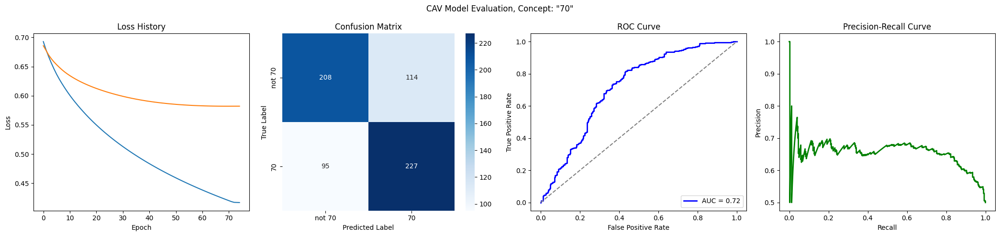

In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
